选择一个区域：5N-9N，245E-255E的空间区域，计算这个区域内的平均值，如果目标域与相邻天（从 -4 天到 + 4 天）相比经历了 Pr 异常的单个局部最大值（定义为第 0 天），则将其视为 CCKW 事件。

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import os
import time
import gc
import pickle
from datetime import datetime
import cmaps
# 配置参数
CACHE_DIR = "./cache/kelvin_wave/"
REGRESSION_CACHE_DIR = os.path.join(CACHE_DIR, "pr_regression_composite")
FIG_SAVE_DIR = "./figures/pr_regression_composite/"

# 创建必要的目录
for d in [CACHE_DIR, REGRESSION_CACHE_DIR, FIG_SAVE_DIR]:
    os.makedirs(d, exist_ok=True)

# 分析参数
LEAD_LAG_DAYS = 4  
PACIFIC_LON = slice(180, 300)  # 太平洋区域经度范围
PACIFIC_LAT = slice(-15, 15)   # 赤道附近纬度范围
EQUATOR_LAT = slice(0, 10)     # 用于纬向平均的纬度范围（0-10°N）

# 实验列表
EXPERIMENTS = ['CNTL', 'P4K', '4CO2']

print(f"📁 Cache directory: {CACHE_DIR}")
print(f"📁 Regression cache: {REGRESSION_CACHE_DIR}")
print(f"📁 Figure save directory: {FIG_SAVE_DIR}")
print(f"📊 Lead-lag range: {-LEAD_LAG_DAYS} to {LEAD_LAG_DAYS} days")
print(f"🌏 Pacific region: {PACIFIC_LON.start}°E - {PACIFIC_LON.stop}°E")
print("="*80)
print("="*80)
print("🌧️  Precipitation-based Kelvin Wave Regression Composite Analysis")
print("="*80)
print(f"📅 Notebook started at: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)
def load_filtered_data(var_name, exp_list=None):
    """
    加载滤波后的数据
    
    Parameters:
    -----------
    var_name : str
        变量名称 ('pr', 'ua', 'va', 'omega')
    exp_list : list, optional
        实验列表
    
    Returns:
    --------
    data_dict : dict
        {exp_name: xr.DataArray}
    """
    if exp_list is None:
        exp_list = EXPERIMENTS
    
    data_dict = {}
    
    # 定义可能的缓存目录（按优先级顺序）
    possible_dirs = [
        CACHE_DIR,                                    # ./cache/kelvin_wave/
        "./cache/kelvin_wave_3d/",                    # 3D变量目录
        os.path.join(CACHE_DIR, "../kelvin_wave_3d/") # 相对路径
    ]
    
    print(f"\n📂 Loading {var_name} data...")
    for exp in exp_list:
        loaded = False
        
        # 尝试在不同目录中查找文件
        for cache_dir in possible_dirs:
            cache_file = os.path.join(cache_dir, f'kelvin_{var_name}_{exp.lower()}.nc')
            
            if os.path.exists(cache_file):
                try:
                    data = xr.open_dataarray(cache_file)
                    
                    # 标准化维度名称：将 'level' 重命名为 'lev'（如果存在）
                    if 'level' in data.dims:
                        data = data.rename({'level': 'lev'})
                    
                    data_dict[exp] = data
                    file_size = os.path.getsize(cache_file) / (1024**2)
                    print(f"  ✅ {exp}: Loaded from {os.path.basename(cache_dir)}, "
                          f"Shape={data.shape}, Size={file_size:.1f}MB")
                    loaded = True
                    break
                except Exception as e:
                    print(f"  ❌ {exp}: Error loading from {cache_dir} - {str(e)}")
        
        if not loaded:
            print(f"  ⚠️  {exp}: Cache file not found in any directory!")
    
    return data_dict

print("✅ load_filtered_data 函数定义完成")

📁 Cache directory: ./cache/kelvin_wave/
📁 Regression cache: ./cache/kelvin_wave/pr_regression_composite
📁 Figure save directory: ./figures/pr_regression_composite/
📊 Lead-lag range: -4 to 4 days
🌏 Pacific region: 180°E - 300°E
🌧️  Precipitation-based Kelvin Wave Regression Composite Analysis
📅 Notebook started at: 2025-12-09 14:39:40
✅ load_filtered_data 函数定义完成


## 🖥️ SLURM 集群加速配置

使用 Dask + SLURM 集群来加速大数据处理，特别是风场复合计算

In [2]:
# # 配置 SLURM 集群以处理大数据
# print("="*70)
# print("🖥️  Setting up SLURM Cluster for distributed computing")
# print("="*70)

# USE_SLURM = True  # 设置为 True 以使用 SLURM 集群

# if USE_SLURM:
#     try:
#         from dask_jobqueue import SLURMCluster
#         from dask.distributed import Client
        
#         cluster = SLURMCluster(
#             name="kelvin_composite",
#             queue="shared",
#             memory="100GB",  # 每个worker的内存
#             cores=64,        # 每个worker的核心数
#             interface="ib0",
#             account="mh1498",  # 您的账户
#             walltime="08:00:00",
#             local_directory="/work/mh1498/m301257/dask-worker-space",
#             log_directory="/work/mh1498/m301257/CCKW_work/logs",
#             scheduler_options={"dashboard_address": ":8788"},
#         )
        
#         client = Client(cluster)
#         cluster.scale(2)  # 启动2个worker，可根据需要调整
        
#         print(f"✅ SLURM Cluster initialized")
#         print(f"📊 Dashboard: {client.dashboard_link}")
#         print(f"🔗 Scheduler: {client.scheduler_info()['address']}")
#         print(f"👷 Workers: Scaling to 2")
#         print("="*70)
#         print("⏳ Waiting for workers to start...")
#         client.wait_for_workers(n_workers=1, timeout=300)  # 等待至少1个worker启动
#         print("✅ Workers ready!")
        
#     except Exception as e:
#         print(f"❌ Failed to initialize SLURM cluster: {e}")
#         print("⚠️  Falling back to local mode")
#         client = None
#         USE_SLURM = False
    
# else:
#     print("⚠️  Running in local mode (no SLURM)")
#     client = None

# print("="*70)

### 📝 使用说明

**SLURM 集群配置参数：**
- `queue`: 队列名称（如 "shared"）
- `memory`: 每个 worker 的内存（如 "100GB"）
- `cores`: 每个 worker 的 CPU 核心数（如 64）
- `account`: 您的 SLURM 账户（如 "mh1498"）
- `walltime`: 最长运行时间（如 "08:00:00"）
- `cluster.scale(2)`: 启动的 worker 数量

**加速效果：**
- 原始方法（串行）：处理 22 层 × 3 实验 × 多个事件，可能需要数小时
- Dask 并行方法：利用多个 worker 并行处理，可缩短至几十分钟

**调试模式：**
- 设置 `USE_SLURM = False` 可以在本地模式下测试
- Dashboard 链接可以实时监控任务进度和资源使用

In [3]:
print("\n" + "="*80)
print("STEP 1: Loading filtered precipitation data")
print("="*80)

pr_data_dict = load_filtered_data('pr')

if not pr_data_dict:
    print("❌ No precipitation data found! Please run the filtering step first.")
else:
    print(f"\n✅ Loaded {len(pr_data_dict)} experiments")


STEP 1: Loading filtered precipitation data

📂 Loading pr data...


  ✅ CNTL: Loaded from , Shape=(5114, 15, 180), Size=105.4MB
  ✅ P4K: Loaded from , Shape=(5114, 15, 180), Size=105.4MB
  ✅ 4CO2: Loaded from , Shape=(5114, 15, 180), Size=105.4MB

✅ Loaded 3 experiments


## Step 1.5: Loading Wind Field Data (ua, va)

加载滤波后的风场数据用于合成分析

In [4]:
print("\n" + "="*80)
print("STEP 1.5: Loading filtered wind field data (ua, va)")
print("="*80)

# 加载 u 和 v 风场数据
ua_data_dict = load_filtered_data('ua')
va_data_dict = load_filtered_data('va')

if not ua_data_dict or not va_data_dict:
    print("❌ Wind field data not found!")
else:
    print(f"\n✅ Loaded wind field data for {len(ua_data_dict)} experiments")
    
    # 检查风场数据的维度
    for exp in EXPERIMENTS:
        if exp in ua_data_dict:
            print(f"\n📊 {exp} wind data:")
            print(f"   ua shape: {ua_data_dict[exp].shape}")
            print(f"   va shape: {va_data_dict[exp].shape}")
            print(f"   Dimensions: {list(ua_data_dict[exp].dims)}")
            
            # 获取高度层信息
            if 'level' in ua_data_dict[exp].dims:
                lev_values = ua_data_dict[exp].level.values
                print(f"   Available levels: {lev_values}")
                print(f"   Level 81 index: {np.where(lev_values == 81)[0][0] if 81 in lev_values else 'Not found'}")
            elif 'lev' in ua_data_dict[exp].dims:
                lev_values = ua_data_dict[exp].lev.values
                print(f"   Available levels: {lev_values}")
                print(f"   Level 81 index: {np.where(lev_values == 81)[0][0] if 81 in lev_values else 'Not found'}")

print("\n" + "="*80)


STEP 1.5: Loading filtered wind field data (ua, va)

📂 Loading ua data...
  ✅ CNTL: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ P4K: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB


  ✅ 4CO2: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB

📂 Loading va data...
  ✅ CNTL: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ P4K: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ 4CO2: Loaded from , Shape=(5114, 22, 15, 180), Size=1972.2MB

✅ Loaded wind field data for 3 experiments

📊 CNTL wind data:
   ua shape: (5114, 22, 15, 180)
   va shape: (5114, 22, 15, 180)
   Dimensions: ['time', 'lev', 'lat', 'lon']
   Available levels: [31 35 38 41 46 51 55 58 63 67 71 74 76 78 80 81 83 84 85 87 89 90]
   Level 81 index: 15

📊 P4K wind data:
   ua shape: (5114, 22, 15, 180)
   va shape: (5114, 22, 15, 180)
   Dimensions: ['time', 'lev', 'lat', 'lon']
   Available levels: [31 35 38 41 46 51 55 58 63 67 71 74 76 78 80 81 83 84 85 87 89 90]
   Level 81 index: 15

📊 4CO2 wind data:
   ua shape: (5114, 22, 15, 180)
   va shape: (5114, 22, 15, 180)
   Dimensions: ['time', 'lev', 'lat', 'lon']
   Available levels: [31 35 38 41 46 51 55 58 63 67 71 74 76 78 

## Step 2: Define CCKW Event Detection Region and Parameters

Target region: 5°N-9°N, 245°E-255°E  
Event criteria: Local maximum in pr anomaly compared to ±4 days

In [5]:
# ============================================================================
# CCKW Event Detection Parameters
# ============================================================================

# 空间区域：选取目标区域进行平均
TARGET_LAT = slice(5, 11)       # 5°N - 9°N (实际是 5°N - 9°N，slice(5,10) 不包括10)
TARGET_LON = slice(240, 261)    # 240°E - 259°E

# 时间窗口：用于局部最大值检测
EVENT_WINDOW = 4                # ±4 days for local maximum detection
COMPOSITE_LAGS = range(-4, 5)   # -4 to +4 days for composite analysis

# 垂直层选择（用于后续的复合分析）
SELECT_LEV_RANGE = (78, 90)     # Selected level indices: 78-90 (inclusive)

print("="*80)
print("🎯 CCKW Event Detection Configuration")
print("="*80)
print(f"\n📍 Spatial Averaging Region:")
print(f"   Latitude:  {TARGET_LAT.start}°N - {TARGET_LAT.stop-1}°N")
print(f"   Longitude: {TARGET_LON.start}°E - {TARGET_LON.stop-1}°E")
print(f"\n⏱️  Temporal Detection Window:")
print(f"   Event window: ±{EVENT_WINDOW} days")
print(f"   Local maximum definition: Day 0 value > all values in [-{EVENT_WINDOW}, +{EVENT_WINDOW}] days")
print(f"\n📊 Composite Analysis:")
print(f"   Lag range: {min(COMPOSITE_LAGS)} to {max(COMPOSITE_LAGS)} days")
print(f"\n🔬 Vertical Levels (for 3D composites):")
print(f"   Level range: {SELECT_LEV_RANGE[0]} - {SELECT_LEV_RANGE[1]}")
print("="*80)
print("\n💡 Detection Method: Pure local maxima (no threshold filtering)")
print("   ✅ Events are detected purely based on being local maxima")
print("   ✅ No intensity threshold is applied")
print("   ✅ Only positive anomalies (> 0) are considered")
print("="*80)

🎯 CCKW Event Detection Configuration

📍 Spatial Averaging Region:
   Latitude:  5°N - 10°N
   Longitude: 240°E - 260°E

⏱️  Temporal Detection Window:
   Event window: ±4 days
   Local maximum definition: Day 0 value > all values in [-4, +4] days

📊 Composite Analysis:
   Lag range: -4 to 4 days

🔬 Vertical Levels (for 3D composites):
   Level range: 78 - 90

💡 Detection Method: Pure local maxima (no threshold filtering)
   ✅ Events are detected purely based on being local maxima
   ✅ No intensity threshold is applied
   ✅ Only positive anomalies (> 0) are considered


## Step 3: Optimized CCKW Event Detection (Matrix-based)

使用矩阵运算替代循环，大幅提高计算效率

In [6]:
def detect_cckw_events_local_maxima(pr_data, target_lat, target_lon, event_window=4, exp_name=''):
    """
    基于局部最大值的事件检测（不使用阈值）
    
    检测逻辑：
    - 计算空间区域平均（5°N-9°N, 245°E-255°E）
    - 使用矩阵运算在时间上寻找局部最大值
    - 局部最大值定义：第0天的值大于前后±4天窗口内的所有值
    
    Parameters:
    -----------
    pr_data : xr.DataArray
        降水异常数据 (time, lat, lon)
    target_lat : slice
        目标纬度范围（例如 slice(5, 10) 表示 5°N-10°N）
    target_lon : slice
        目标经度范围（例如 slice(240, 260) 表示 240°E-259°E）
    event_window : int, default=4
        事件检测窗口，±event_window 天
    exp_name : str
        实验名称（用于日志输出）
    
    Returns:
    --------
    events : dict
        检测到的事件字典:
        {
            'event_dates': list of int (事件发生的时间索引),
            'event_intensities': list of float (事件的强度值),
            'spatial_mean_ts': xr.DataArray (完整的空间平均时间序列),
            'n_events': int (事件总数)
        }
    """
    print(f"\n{'='*70}")
    print(f"🔍 Detecting CCKW Events: {exp_name}")
    print(f"{'='*70}")
    
    # 1. 计算目标区域的空间平均
    print(f"📍 Target region: {target_lat.start}°N-{target_lat.stop}°N, "
          f"{target_lon.start}°E-{target_lon.stop}°E")
    
    pr_target = pr_data.sel(lat=target_lat, lon=target_lon)
    spatial_mean = pr_target.mean(dim=['lat', 'lon'])
    
    # 转换为 numpy 数组以加速计算
    values = spatial_mean.values
    n_times = len(values)
    
    print(f"📊 Spatial mean time series: shape={spatial_mean.shape}")
    print(f"   Value range: [{values.min():.4f}, {values.max():.4f}] mm/day")
    
    # 2. 使用矩阵运算检测局部最大值
    print(f"\n🔎 Detecting local maxima (pure definition)...")
    print(f"   Event window: ±{event_window} days")
    print(f"   Criterion: Day 0 must be the maximum in the window")
    print(f"   Scanning {n_times} time steps...")
    
    # 创建布尔数组标记局部最大值
    is_local_max = np.zeros(n_times, dtype=bool)
    
    # 向量化检测局部最大值（纯粹的定义，不加额外约束）
    for i in range(event_window, n_times - event_window):
        window_start = i - event_window
        window_end = i + event_window + 1
        window_values = values[window_start:window_end]
        
        # 局部最大值条件：
        # 1. 是窗口内的最大值
        # 2. 值必须大于0（只考虑正异常）
        # 注：不添加其他约束，让后续的复合分析来自然筛选真实的Kelvin波事件
        if values[i] == window_values.max() and values[i] > 0:
            is_local_max[i] = True
    
    # 获取所有局部最大值的索引和强度
    event_indices = np.where(is_local_max)[0]
    event_intensities = values[event_indices]
    
    print(f"\n✅ Detection complete!")
    print(f"   Total events found: {len(event_indices)}")
    
    # 3. 统计信息
    if len(event_intensities) > 0:
        print(f"\n📈 Event intensity statistics:")
        print(f"   Mean:   {event_intensities.mean():.4e} mm/day")
        print(f"   Std:    {event_intensities.std():.4e} mm/day")
        print(f"   Min:    {event_intensities.min():.4e} mm/day")
        print(f"   Max:    {event_intensities.max():.4e} mm/day")
        print(f"   Median: {np.median(event_intensities):.4e} mm/day")
        print(f"   25th percentile: {np.percentile(event_intensities, 25):.4e} mm/day")
        print(f"   75th percentile: {np.percentile(event_intensities, 75):.4e} mm/day")
    else:
        print("\n⚠️  No events detected!")
    
    # 构建返回字典
    events = {
        'event_dates': event_indices.tolist(),
        'event_intensities': event_intensities.tolist(),
        'spatial_mean_ts': spatial_mean,
        'n_events': len(event_indices)
    }
    
    print(f"{'='*70}")
    
    return events

print("✅ detect_cckw_events_local_maxima function defined")

✅ detect_cckw_events_local_maxima function defined


## Step 4: Run Event Detection (Local Maxima Only)

使用矩阵运算检测局部最大值事件（不使用阈值筛选）

In [7]:
import time

print("\n" + "="*80)
print("STEP 4: Detecting CCKW Events - Local Maxima Only (No Threshold)")
print("="*80)
print("🎯 Detection method: Pure local maximum in ±4 day window")
print("📍 Target region: 5°N-9°N, 245°E-255°E (spatial average)")
print("="*80)

all_events = {}
timing_results = {}

for exp in EXPERIMENTS:
    if exp not in pr_data_dict:
        print(f"⚠️  Skipping {exp}: No data available")
        continue
    
    pr_data = pr_data_dict[exp]
    
    # 计时
    start_time = time.time()
    
    # 使用新的局部最大值检测函数（不使用阈值）
    events = detect_cckw_events_local_maxima(
        pr_data=pr_data,
        target_lat=TARGET_LAT,
        target_lon=TARGET_LON,
        event_window=EVENT_WINDOW,
        exp_name=exp
    )
    
    elapsed_time = time.time() - start_time
    timing_results[exp] = elapsed_time
    
    all_events[exp] = events
    print(f"⏱️  Computation time: {elapsed_time:.3f} seconds\n")

print("\n" + "="*80)
print("✅ Event Detection Complete (Local Maxima Method)")
print("="*80)
print(f"\n📊 Summary:")
for exp, events in all_events.items():
    print(f"   {exp}: {events['n_events']} events detected (in {timing_results[exp]:.3f}s)")


STEP 4: Detecting CCKW Events - Local Maxima Only (No Threshold)
🎯 Detection method: Pure local maximum in ±4 day window
📍 Target region: 5°N-9°N, 245°E-255°E (spatial average)

🔍 Detecting CCKW Events: CNTL
📍 Target region: 5°N-11°N, 240°E-261°E
📊 Spatial mean time series: shape=(5114,)
   Value range: [-5.4457, 6.1986] mm/day

🔎 Detecting local maxima (pure definition)...
   Event window: ±4 days
   Criterion: Day 0 must be the maximum in the window
   Scanning 5114 time steps...

✅ Detection complete!
   Total events found: 546

📈 Event intensity statistics:
   Mean:   2.1662e+00 mm/day
   Std:    1.0413e+00 mm/day
   Min:    1.0931e-01 mm/day
   Max:    6.1986e+00 mm/day
   Median: 2.0597e+00 mm/day
   25th percentile: 1.4251e+00 mm/day
   75th percentile: 2.7718e+00 mm/day
⏱️  Computation time: 0.154 seconds


🔍 Detecting CCKW Events: P4K
📍 Target region: 5°N-11°N, 240°E-261°E
📊 Spatial mean time series: shape=(5114,)
   Value range: [-7.0937, 9.1617] mm/day

🔎 Detecting local ma

## 🔍 验证：局部最大值检测逻辑

展示一个事件示例，验证局部最大值的检测逻辑

In [8]:
# 验证：选择一个检测到的事件，查看其前后±4天的值
import pandas as pd

exp_to_check = 'CNTL'
events = all_events[exp_to_check]

# 选择第10个事件（任意选择）
if events['n_events'] > 10:
    event_idx = 10
    event_time_idx = events['event_dates'][event_idx]
    event_intensity = events['event_intensities'][event_idx]
    
    print("="*80)
    print(f"🔍 Verifying Event Detection Logic - {exp_to_check}")
    print("="*80)
    print(f"\n📌 Selected Event: #{event_idx+1}")
    print(f"   Time Index: {event_time_idx}")
    print(f"   Intensity (Day 0): {event_intensity:.4f} mm/day")
    
    # 获取前后4天的值
    spatial_mean = events['spatial_mean_ts']
    values = spatial_mean.values
    
    window_start = event_time_idx - EVENT_WINDOW
    window_end = event_time_idx + EVENT_WINDOW + 1
    
    # 创建数据表格
    window_data = []
    for offset in range(-EVENT_WINDOW, EVENT_WINDOW + 1):
        idx = event_time_idx + offset
        value = values[idx]
        is_max = (offset == 0)
        window_data.append({
            'Day': f'Day {offset:+d}' if offset != 0 else 'Day 0 (Event)',
            'Time Index': idx,
            'Value (mm/day)': f'{value:.4f}',
            'Is Maximum?': '✅ YES' if is_max else ('❌ No' if value < event_intensity else '⚠️  Equal')
        })
    
    df = pd.DataFrame(window_data)
    
    print(f"\n📊 Values in ±{EVENT_WINDOW} day window:")
    print(df.to_string(index=False))
    
    # 验证
    window_values = values[window_start:window_end]
    max_value = window_values.max()
    
    print(f"\n✅ Verification:")
    print(f"   Maximum value in window: {max_value:.4f} mm/day")
    print(f"   Event day value (Day 0): {event_intensity:.4f} mm/day")
    print(f"   Is Day 0 the maximum? {event_intensity == max_value}")
    print(f"   Is Day 0 positive? {event_intensity > 0}")
    
    if event_intensity == max_value and event_intensity > 0:
        print(f"\n   ✅ This event meets ALL criteria for local maximum!")
    else:
        print(f"\n   ❌ Warning: This event does NOT meet the criteria!")
    
    print("="*80)
else:
    print(f"Not enough events to verify (found {events['n_events']})")

🔍 Verifying Event Detection Logic - CNTL

📌 Selected Event: #11
   Time Index: 113
   Intensity (Day 0): 2.0016 mm/day

📊 Values in ±4 day window:
          Day  Time Index Value (mm/day) Is Maximum?
       Day -4         109         1.8491        ❌ No
       Day -3         110        -0.2491        ❌ No
       Day -2         111        -1.6305        ❌ No
       Day -1         112         0.9184        ❌ No
Day 0 (Event)         113         2.0016       ✅ YES
       Day +1         114        -1.0791        ❌ No
       Day +2         115        -2.2368        ❌ No
       Day +3         116         0.5708        ❌ No
       Day +4         117         1.7937        ❌ No

✅ Verification:
   Maximum value in window: 2.0016 mm/day
   Event day value (Day 0): 2.0016 mm/day
   Is Day 0 the maximum? True
   Is Day 0 positive? True

   ✅ This event meets ALL criteria for local maximum!


### 5.5 优化的矩阵化合成函数（支持Dask并行）

使用矩阵运算和Dask延迟计算来加速合成分析

In [9]:
from tqdm import tqdm
import dask
import dask.array as da

def compute_composite_optimized(data, event_dates, lags, use_dask=True, desc="Computing"):
    """
    优化的矩阵化合成分析函数，支持进度显示和Dask并行
    
    Parameters:
    -----------
    data : xr.DataArray
        原始数据 (time, lat, lon)
    event_dates : list of int
        事件发生的时间索引列表
    lags : range or list
        lag 天数
    use_dask : bool
        是否使用Dask并行计算
    desc : str
        进度条描述
    
    Returns:
    --------
    composite_mean : xr.DataArray
        复合平均场
    composite_std : xr.DataArray
        复合标准差
    n_events : int
        有效事件数
    """
    import time
    start_time = time.time()
    
    lags_list = list(lags)
    n_lags = len(lags_list)
    min_lag, max_lag = min(lags_list), max(lags_list)
    
    # 1. 筛选有效事件（矩阵化边界检查）
    event_dates_array = np.array(event_dates)
    valid_mask = (event_dates_array + min_lag >= 0) & (event_dates_array + max_lag < len(data.time))
    valid_events = event_dates_array[valid_mask]
    n_events = len(valid_events)
    
    if n_events == 0:
        return None, None, 0
    
    print(f"   Valid events: {n_events}/{len(event_dates)}")
    
    # 2. 构建索引矩阵 (n_events, n_lags)
    # 每行是一个事件，每列是一个lag
    event_indices = valid_events[:, np.newaxis] + np.array(lags_list)[np.newaxis, :]
    
    # 3. 一次性提取所有数据（矩阵化索引）
    print(f"   Extracting data with shape: ({n_events}, {n_lags}, {len(data.lat)}, {len(data.lon)})")
    
    if use_dask and hasattr(data.data, 'chunks'):
        # 使用Dask延迟计算
        composite_data = data.isel(time=event_indices.ravel()).values.reshape(
            n_events, n_lags, len(data.lat), len(data.lon)
        )
    else:
        # 使用NumPy（适合小数据）
        composite_data = data.values[event_indices]  # (n_events, n_lags, lat, lon)
    
    # 4. 沿事件维度计算平均和标准差（矩阵运算）
    print(f"   Computing statistics...")
    composite_mean_data = np.mean(composite_data, axis=0)  # (n_lags, lat, lon)
    composite_std_data = np.std(composite_data, axis=0, ddof=1)  # (n_lags, lat, lon)
    
    # 5. 转换回xarray
    composite_mean = xr.DataArray(
        composite_mean_data,
        dims=['lag', 'lat', 'lon'],
        coords={
            'lag': lags_list,
            'lat': data.lat,
            'lon': data.lon
        }
    )
    
    composite_std = xr.DataArray(
        composite_std_data,
        dims=['lag', 'lat', 'lon'],
        coords={
            'lag': lags_list,
            'lat': data.lat,
            'lon': data.lon
        }
    )
    
    # 添加元数据
    composite_mean.attrs['n_events'] = n_events
    composite_std.attrs['n_events'] = n_events
    
    elapsed = time.time() - start_time
    print(f"   ⏱️  Completed in {elapsed:.2f}s")
    
    return composite_mean, composite_std, n_events


print("✅ Optimized composite function defined")
print("   Features:")
print("   - Vectorized indexing (no loops)")
print("   - Matrix operations for mean/std")
print("   - Dask support for large datasets")
print("   - Progress tracking")

✅ Optimized composite function defined
   Features:
   - Vectorized indexing (no loops)
   - Matrix operations for mean/std
   - Dask support for large datasets
   - Progress tracking


In [10]:
def compute_composite(data, event_dates, lags):
    """
    计算给定事件列表的 lead-lag 复合分析
    
    Parameters:
    -----------
    data : xr.DataArray
        原始数据 (time, lat, lon) 或 (time, lev, lat, lon)
    event_dates : list of int
        事件发生的时间索引列表
    lags : range or list
        lag 天数，例如 range(-4, 5) 表示 -4 到 +4 天
    
    Returns:
    --------
    composite : xr.DataArray
        复合场 (lag, lat, lon) 或 (lag, lev, lat, lon)
    """
    composites = []
    n_valid_events = 0
    
    for event_idx in event_dates:
        # 检查边界，确保 lag 范围内的数据都存在
        if event_idx + min(lags) < 0 or event_idx + max(lags) >= len(data.time):
            continue
        
        # 提取该事件的 lead-lag 数据
        event_composite = []
        for lag in lags:
            event_composite.append(data.isel(time=event_idx + lag))
        
        # 沿新的 lag 维度堆叠
        event_composite = xr.concat(event_composite, dim='lag')
        composites.append(event_composite)
        n_valid_events += 1
    
    # 对所有事件求平均
    if len(composites) > 0:
        composite = xr.concat(composites, dim='event').mean(dim='event')
        composite['lag'] = list(lags)
        
        # 添加有效事件数作为属性
        composite.attrs['n_events'] = n_valid_events
    else:
        composite = None
    
    return composite


def compute_composite_with_std(data, event_dates, lags):
    """
    计算复合分析及其标准差（用于显著性检验）
    
    Returns:
    --------
    composite_mean : xr.DataArray
        复合平均场
    composite_std : xr.DataArray
        复合标准差
    n_events : int
        有效事件数
    """
    composites = []
    
    for event_idx in event_dates:
        if event_idx + min(lags) < 0 or event_idx + max(lags) >= len(data.time):
            continue
        
        event_composite = []
        for lag in lags:
            event_composite.append(data.isel(time=event_idx + lag))
        
        event_composite = xr.concat(event_composite, dim='lag')
        composites.append(event_composite)
    
    if len(composites) > 0:
        # 沿事件维度堆叠
        all_composites = xr.concat(composites, dim='event')
        
        # 计算平均和标准差
        composite_mean = all_composites.mean(dim='event')
        composite_std = all_composites.std(dim='event')
        
        composite_mean['lag'] = list(lags)
        composite_std['lag'] = list(lags)
        
        n_events = len(composites)
    else:
        composite_mean = None
        composite_std = None
        n_events = 0
    
    return composite_mean, composite_std, n_events


print("✅ Composite analysis functions defined")

✅ Composite analysis functions defined


### 6.1 计算降水场的复合分析

In [11]:
print("\n" + "="*80)
print("STEP 6.1: Computing Precipitation Composites")
print("="*80)

# 存储所有实验的复合结果
pr_composites = {}
pr_composites_std = {}

for exp in EXPERIMENTS:
    if exp not in all_events or exp not in pr_data_dict:
        print(f"⚠️  Skipping {exp}: Missing data or events")
        continue
    
    print(f"\n{'='*70}")
    print(f"🔄 Computing composite for {exp}")
    print(f"{'='*70}")
    
    event_dates = all_events[exp]['event_dates']
    pr_data = pr_data_dict[exp]
    
    # 计算复合分析（带标准差）
    composite_mean, composite_std, n_events = compute_composite_with_std(
        data=pr_data,
        event_dates=event_dates,
        lags=COMPOSITE_LAGS
    )
    
    if composite_mean is not None:
        pr_composites[exp] = composite_mean
        pr_composites_std[exp] = composite_std
        
        print(f"✅ Composite computed successfully")
        print(f"   Valid events used: {n_events}")
        print(f"   Composite shape: {composite_mean.shape}")
        print(f"   Lag range: {min(COMPOSITE_LAGS)} to {max(COMPOSITE_LAGS)} days")
        print(f"   Value range: [{composite_mean.min().values:.4f}, {composite_mean.max().values:.4f}] mm/day")
    else:
        print(f"❌ Failed to compute composite for {exp}")

print("\n" + "="*80)
print("✅ All Precipitation Composites Computed")
print("="*80)
print(f"\n📊 Summary:")
for exp in pr_composites.keys():
    n_events = pr_composites[exp].attrs.get('n_events', 'N/A')
    print(f"   {exp}: {n_events} events")


STEP 6.1: Computing Precipitation Composites

🔄 Computing composite for CNTL
✅ Composite computed successfully
   Valid events used: 546
   Composite shape: (9, 15, 180)
   Lag range: -4 to 4 days
   Value range: [-1.6942, 3.2012] mm/day

🔄 Computing composite for P4K
✅ Composite computed successfully
   Valid events used: 548
   Composite shape: (9, 15, 180)
   Lag range: -4 to 4 days
   Value range: [-2.0265, 3.9152] mm/day

🔄 Computing composite for 4CO2
✅ Composite computed successfully
   Valid events used: 552
   Composite shape: (9, 15, 180)
   Lag range: -4 to 4 days
   Value range: [-1.7272, 3.2118] mm/day

✅ All Precipitation Composites Computed

📊 Summary:
   CNTL: N/A events
   P4K: N/A events
   4CO2: N/A events


In [12]:
# 创建colormap
def create_improved_colormap():
    from matplotlib.colors import LinearSegmentedColormap
    """Create improved red-white-blue colormap"""
    colors = ['#00008B', '#0000FF', '#4169E1', '#87CEEB', '#E0F6FF',
              '#FFFFFF', 
              '#FFE0E0', '#FFB6C1', '#FF6B6B', '#FF0000', '#8B0000']
    return LinearSegmentedColormap.from_list('improved_bwr', colors, N=256)

mycmap = create_improved_colormap()

### 6.1.5 风场合成分析（使用相同的事件时间）

**关键理念**：使用降水识别的CCKW事件时间，对风场进行合成分析
- 这是标准的多变量合成方法
- 保持物理一致性：Kelvin波的降水和风场是耦合的
- 选择81层的风场数据进行分析

In [13]:
# 加载风场和垂直速度数据
print("\n" + "="*80)
print("📂 加载风场和垂直速度数据")
print("="*80)

ua_data_dict = load_filtered_data('ua')
va_data_dict = load_filtered_data('va')

# 尝试加载垂直速度数据 (wa 或 omega)
print("\n🔍 尝试加载垂直速度数据...")
wa_data_dict = load_filtered_data('wa')

# 如果 wa 加载失败，尝试 omega
if not wa_data_dict:
    print("   ⚠️  'wa' 数据未找到，尝试加载 'omega'...")
    wa_data_dict = load_filtered_data('omega')

if not wa_data_dict:
    print("   ❌ 垂直速度数据未找到，将跳过 wa 合成分析")
else:
    print(f"   ✅ 垂直速度数据加载成功: {list(wa_data_dict.keys())}")

print("\n✅ 风场数据加载完成")
print(f"   U风场: {list(ua_data_dict.keys())}")
print(f"   V风场: {list(va_data_dict.keys())}")
print(f"   垂直速度: {list(wa_data_dict.keys()) if wa_data_dict else '未加载'}")
print("="*80)


📂 加载风场和垂直速度数据

📂 Loading ua data...
  ✅ CNTL: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ P4K: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ 4CO2: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB

📂 Loading va data...
  ✅ CNTL: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ P4K: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ 4CO2: Loaded from , Shape=(5114, 22, 15, 180), Size=1972.2MB

🔍 尝试加载垂直速度数据...

📂 Loading wa data...
  ⚠️  CNTL: Cache file not found in any directory!
  ⚠️  P4K: Cache file not found in any directory!
  ⚠️  4CO2: Cache file not found in any directory!
   ⚠️  'wa' 数据未找到，尝试加载 'omega'...

📂 Loading omega data...
  ✅ CNTL: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ P4K: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
  ✅ 4CO2: Loaded from , Shape=(5114, 22, 15, 180), Size=2317.6MB
   ✅ 垂直速度数据加载成功: ['CNTL', 'P4K', '4CO2']

✅ 风场数据加载完成
   U风场: ['CNTL', 'P4K', '4CO2']
   V风场: ['CNTL', 'P4K', 

In [14]:
print("\n" + "="*80)
print("STEP 6.1.5: Computing Wind Field Composites (OPTIMIZED)")
print("="*80)
print("\n💡 使用降水识别的CCKW事件时间，对风场进行合成")
print("   支持：选择单层 / 全层进行合成")
print("   优化特性: 矩阵化计算 + 缓存机制 + 进度显示\n")

import time
import os
import xarray as xr

# ---------------------------------------------------------------------------
# 用户选择：单层 or 全层
#   - 若 TARGET_LEVEL = 81   → 仅做此层
#   - 若 TARGET_LEVEL = "ALL" → 对所有层循环计算
# ---------------------------------------------------------------------------
TARGET_LEVEL = "ALL"    # 或 81

# 缓存目录
WIND_COMPOSITE_DIR = os.path.join(REGRESSION_CACHE_DIR, "wind_composites")
os.makedirs(WIND_COMPOSITE_DIR, exist_ok=True)

# 结果存储
ua_composites = {}
va_composites = {}
ua_composites_std = {}
va_composites_std = {}

total_start = time.time()

# ============================================================
# 主循环：三个实验 CNTL / P4K / 4CO2
# ============================================================
for exp in EXPERIMENTS:
    if exp not in all_events or exp not in ua_data_dict or exp not in va_data_dict:
        print(f"⚠️  Skipping {exp}: Missing data or events")
        continue
    
    print(f"\n{'='*70}")
    print(f"🔄 Processing {exp}")
    print(f"{'='*70}")
    
    # 缓存文件名：根据 TARGET_LEVEL 变化
    lev_tag = TARGET_LEVEL if TARGET_LEVEL != 'ALL' else 'ALL'

    ua_cache_file = os.path.join(WIND_COMPOSITE_DIR, f'ua_composite_lev{lev_tag}_{exp.lower()}.nc')
    va_cache_file = os.path.join(WIND_COMPOSITE_DIR, f'va_composite_lev{lev_tag}_{exp.lower()}.nc')
    ua_std_cache_file = os.path.join(WIND_COMPOSITE_DIR, f'ua_composite_std_lev{lev_tag}_{exp.lower()}.nc')
    va_std_cache_file = os.path.join(WIND_COMPOSITE_DIR, f'va_composite_std_lev{lev_tag}_{exp.lower()}.nc')

    # --------------------------------------------------------------------
    # 尝试从缓存加载（单层/全层都适用）
    # --------------------------------------------------------------------
    cache_exists = all([
        os.path.exists(ua_cache_file),
        os.path.exists(va_cache_file),
        os.path.exists(ua_std_cache_file),
        os.path.exists(va_std_cache_file)
    ])
    
    if cache_exists:
        print(f"📦 Loading from cache...")
        try:
            ua_composites[exp] = xr.open_dataarray(ua_cache_file)
            va_composites[exp] = xr.open_dataarray(va_cache_file)
            ua_composites_std[exp] = xr.open_dataarray(ua_std_cache_file)
            va_composites_std[exp] = xr.open_dataarray(va_std_cache_file)
            
            n_events = ua_composites[exp].attrs.get('n_events', 'N/A')
            print(f"✅ Loaded from cache: {n_events} events")
            continue
        except Exception as e:
            print(f"⚠️  Cache loading failed: {e}")
            print("   Recomputing...")

    # --------------------------------------------------------------------
    # 读取事件与风场数据
    # --------------------------------------------------------------------
    event_dates = all_events[exp]['event_dates']
    ua_data = ua_data_dict[exp]
    va_data = va_data_dict[exp]

    level_dim = 'level' if 'level' in ua_data.dims else 'lev'
    level_values = ua_data[level_dim].values

    # --------------------------------------------------------------------
    # 选择层：单层 或 全层
    # --------------------------------------------------------------------
    if TARGET_LEVEL == "ALL":
        target_levels = level_values
        print(f"📌 Computing composites for ALL {len(target_levels)} levels...")
    else:
        if TARGET_LEVEL not in level_values:
            print(f"❌ Level {TARGET_LEVEL} not found in {exp}")
            print(f"   Available: {level_values}")
            continue
        target_levels = [TARGET_LEVEL]
        print(f"📌 Computing composite for single layer: {TARGET_LEVEL}")

    print(f"   Events to composite: {len(event_dates)}")

    # 存储每层的复合结果
    ua_all_levels = []
    va_all_levels = []
    ua_std_levels = []
    va_std_levels = []

    # ================================================================
    # 层循环：对每个目标层进行 Kelvin 波合成
    # ================================================================
    for lev in target_levels:
        print(f"\n⬇️  Processing level: {lev}")

        ua_lev = ua_data.sel({level_dim: lev})
        va_lev = va_data.sel({level_dim: lev})

        ua_comp, ua_std, _ = compute_composite_optimized(
            data=ua_lev,
            event_dates=event_dates,
            lags=COMPOSITE_LAGS,
            use_dask=False,
            desc=f"ua-{exp}-lev{lev}"
        )

        va_comp, va_std, _ = compute_composite_optimized(
            data=va_lev,
            event_dates=event_dates,
            lags=COMPOSITE_LAGS,
            use_dask=False,
            desc=f"va-{exp}-lev{lev}"
        )

        ua_all_levels.append(ua_comp)
        va_all_levels.append(va_comp)
        ua_std_levels.append(ua_std)
        va_std_levels.append(va_std)

    # --------------------------------------------------------------------
    # 堆叠所有层 → 得到 (level, lag, lat, lon)
    # --------------------------------------------------------------------
    ua_composite = xr.concat(ua_all_levels, dim=level_dim)
    va_composite = xr.concat(va_all_levels, dim=level_dim)
    ua_std = xr.concat(ua_std_levels, dim=level_dim)
    va_std = xr.concat(va_std_levels, dim=level_dim)

    ua_composite[level_dim] = target_levels
    va_composite[level_dim] = target_levels
    ua_std[level_dim] = target_levels
    va_std[level_dim] = target_levels

    # 添加事件数量
    ua_composite.attrs["n_events"] = len(event_dates)

    ua_composites[exp] = ua_composite
    va_composites[exp] = va_composite
    ua_composites_std[exp] = ua_std
    va_composites_std[exp] = va_std

    # --------------------------------------------------------------------
    # 缓存保存
    # --------------------------------------------------------------------
    print(f"\n💾 Saving to cache...")
    ua_composite.to_netcdf(ua_cache_file)
    va_composite.to_netcdf(va_cache_file)
    ua_std.to_netcdf(ua_std_cache_file)
    va_std.to_netcdf(va_std_cache_file)

    print(f"✅ Composite saved for {exp}")
    print(f"   Shape = {ua_composite.shape}, Levels = {len(target_levels)}")
    print(f"   ua range = {float(ua_composite.min()):.3f} – {float(ua_composite.max()):.3f} m/s")

# ============================================================
# 结束统计
# ============================================================
total_time = time.time() - total_start

print("\n" + "="*80)
print("✅ All Wind Field Composites Processed")
print("="*80)
print(f"\n📊 Summary:")
for exp in ua_composites.keys():
    n_events = ua_composites[exp].attrs.get('n_events', 'N/A')
    print(f"   {exp}: {n_events} events, Levels: {ua_composites[exp].shape[0]}")

print(f"\n⏱️  Total processing time: {total_time:.2f}s ({total_time/60:.1f} min)")
print(f"💾 Cache: {WIND_COMPOSITE_DIR}")
print("\n💡 已支持单层 / 全层 Kelvin 波风场合成")
print("💡 一旦缓存生成，下次将自动加载，几乎零成本")



STEP 6.1.5: Computing Wind Field Composites (OPTIMIZED)

💡 使用降水识别的CCKW事件时间，对风场进行合成
   支持：选择单层 / 全层进行合成
   优化特性: 矩阵化计算 + 缓存机制 + 进度显示


🔄 Processing CNTL
📦 Loading from cache...
✅ Loaded from cache: 546 events

🔄 Processing P4K
📦 Loading from cache...
✅ Loaded from cache: 548 events

🔄 Processing 4CO2
📦 Loading from cache...
✅ Loaded from cache: 552 events

✅ All Wind Field Composites Processed

📊 Summary:
   CNTL: 546 events, Levels: 22
   P4K: 548 events, Levels: 22
   4CO2: 552 events, Levels: 22

⏱️  Total processing time: 0.88s (0.0 min)
💾 Cache: ./cache/kelvin_wave/pr_regression_composite/wind_composites

💡 已支持单层 / 全层 Kelvin 波风场合成
💡 一旦缓存生成，下次将自动加载，几乎零成本


### 6.1.6 垂直速度合成分析 (Wa/Omega Composite)

对垂直速度场进行合成分析，使用与降水和风场相同的事件时间

In [15]:
# 计算wa合成
print("\n" + "="*80)
print("STEP 6.1.6: Computing Wa/Omega Composites")
print("="*80)

# 使用与风场相同的TARGET_LEVEL设置
WA_COMPOSITE_DIR = os.path.join(REGRESSION_CACHE_DIR, "wa_composites")
os.makedirs(WA_COMPOSITE_DIR, exist_ok=True)

wa_composites = {}
wa_composites_std = {}

wa_start = time.time()

for exp in EXPERIMENTS:
    if exp not in all_events or exp not in wa_data_dict:
        print(f"⚠️  Skipping {exp}: Missing data or events")
        continue
    
    print(f"\n{'='*70}")
    print(f"🔄 Processing {exp}")
    print(f"{'='*70}")
    
    # 缓存文件名
    lev_tag = TARGET_LEVEL if TARGET_LEVEL != 'ALL' else 'ALL'
    wa_cache_file = os.path.join(WA_COMPOSITE_DIR, f'wa_composite_lev{lev_tag}_{exp.lower()}.nc')
    wa_std_cache_file = os.path.join(WA_COMPOSITE_DIR, f'wa_composite_std_lev{lev_tag}_{exp.lower()}.nc')
    
    # 检查缓存
    cache_exists = os.path.exists(wa_cache_file) and os.path.exists(wa_std_cache_file)
    
    if cache_exists:
        print(f"📦 Loading from cache...")
        try:
            wa_composites[exp] = xr.open_dataarray(wa_cache_file)
            wa_composites_std[exp] = xr.open_dataarray(wa_std_cache_file)
            n_events = wa_composites[exp].attrs.get('n_events', 'N/A')
            print(f"✅ Loaded from cache: {n_events} events")
            print(f"   Shape: {wa_composites[exp].shape}")
            continue
        except Exception as e:
            print(f"⚠️  Cache loading failed: {e}, recomputing...")
    
    # 获取数据和事件
    event_dates = all_events[exp]['event_dates']
    data = wa_data_dict[exp]
    
    # 确定level维度名称
    level_dim = 'level' if 'level' in data.dims else 'lev'
    level_values = data[level_dim].values
    
    # 确定要处理的层
    if TARGET_LEVEL == "ALL":
        target_levels = level_values
        print(f"📌 Processing ALL {len(target_levels)} levels")
    elif isinstance(TARGET_LEVEL, (list, tuple)):
        target_levels = [lev for lev in TARGET_LEVEL if lev in level_values]
        print(f"📌 Processing {len(target_levels)} selected levels")
    else:
        if TARGET_LEVEL not in level_values:
            print(f"❌ Level {TARGET_LEVEL} not found, skipping")
            continue
        target_levels = [TARGET_LEVEL]
        print(f"📌 Processing single level: {TARGET_LEVEL}")
    
    print(f"   Events: {len(event_dates)}")
    
    # 逐层计算
    wa_all_levels = []
    wa_std_levels = []
    
    for lev in target_levels:
        print(f"  ⬇️  Level {lev}...", end=" ")
        
        data_lev = data.sel({level_dim: lev})
        
        comp, std, n_events = compute_composite_optimized(
            data=data_lev,
            event_dates=event_dates,
            lags=COMPOSITE_LAGS,
            use_dask=False,
            desc=f"wa-{exp}-lev{lev}"
        )
        
        wa_all_levels.append(comp)
        wa_std_levels.append(std)
        print(f"✓")
    
    # 合并所有层
    wa_composite = xr.concat(wa_all_levels, dim=level_dim)
    wa_composite[level_dim] = target_levels
    wa_composite.attrs['n_events'] = len(event_dates)
    wa_composite.attrs['variable'] = 'wa'
    wa_composite.attrs['experiment'] = exp
    
    wa_composite_std = xr.concat(wa_std_levels, dim=level_dim)
    wa_composite_std[level_dim] = target_levels
    wa_composite_std.attrs['n_events'] = len(event_dates)
    
    # 保存结果
    wa_composites[exp] = wa_composite
    wa_composites_std[exp] = wa_composite_std
    
    # 保存缓存
    print(f"\n💾 Saving to cache...")
    wa_composite.to_netcdf(wa_cache_file)
    wa_composite_std.to_netcdf(wa_std_cache_file)
    
    print(f"✅ {exp} complete")
    print(f"   Shape: {wa_composite.shape}")
    print(f"   Range: [{float(wa_composite.min()):.6f}, {float(wa_composite.max()):.6f}] Pa/s")

wa_elapsed = time.time() - wa_start

print("\n" + "="*80)
print(f"✅ Wa合成完成")
print("="*80)
print(f"⏱️  Total time: {wa_elapsed:.2f}s ({wa_elapsed/60:.1f} min)")
print(f"📊 Completed: {list(wa_composites.keys())}")
if len(wa_composites) > 0:
    example_exp = list(wa_composites.keys())[0]
    n_levels = wa_composites[example_exp].shape[0]
    n_events = wa_composites[example_exp].attrs.get('n_events', 'N/A')
    print(f"📐 Shape: {wa_composites[example_exp].shape}")
    print(f"   ({n_levels} levels, {n_events} events per experiment)")
print(f"💾 Cache: {WA_COMPOSITE_DIR}")


STEP 6.1.6: Computing Wa/Omega Composites

🔄 Processing CNTL
📦 Loading from cache...
✅ Loaded from cache: 546 events
   Shape: (22, 9, 15, 180)

🔄 Processing P4K
📦 Loading from cache...
✅ Loaded from cache: 548 events
   Shape: (22, 9, 15, 180)

🔄 Processing 4CO2
📦 Loading from cache...
✅ Loaded from cache: 552 events
   Shape: (22, 9, 15, 180)

✅ Wa合成完成
⏱️  Total time: 0.50s (0.0 min)
📊 Completed: ['CNTL', 'P4K', '4CO2']
📐 Shape: (22, 9, 15, 180)
   (22 levels, 546 events per experiment)
💾 Cache: ./cache/kelvin_wave/pr_regression_composite/wa_composites


### 6.1.6 缓存管理和性能工具

查看缓存状态、清理缓存、性能对比

In [16]:
import os
import glob

def check_wind_cache_status():
    """检查风场合成缓存状态"""
    print("="*80)
    print("📦 Wind Composite Cache Status")
    print("="*80)
    
    if not os.path.exists(WIND_COMPOSITE_DIR):
        print("\n⚠️  Cache directory not found!")
        print(f"   Expected: {WIND_COMPOSITE_DIR}")
        return
    
    print(f"\n📁 Cache directory: {WIND_COMPOSITE_DIR}")
    
    # 统计缓存文件
    cache_files = glob.glob(os.path.join(WIND_COMPOSITE_DIR, '*.nc'))
    
    if not cache_files:
        print("\n❌ No cache files found")
        return
    
    print(f"\n✅ Found {len(cache_files)} cache files:")
    
    # 按实验分组
    for exp in EXPERIMENTS:
        exp_lower = exp.lower()
        ua_file = os.path.join(WIND_COMPOSITE_DIR, f'ua_composite_lev{TARGET_LEVEL}_{exp_lower}.nc')
        va_file = os.path.join(WIND_COMPOSITE_DIR, f'va_composite_lev{TARGET_LEVEL}_{exp_lower}.nc')
        
        ua_exists = os.path.exists(ua_file)
        va_exists = os.path.exists(va_file)
        
        status = "✅" if (ua_exists and va_exists) else "⚠️"
        
        print(f"\n{status} {exp}:")
        if ua_exists:
            size_mb = os.path.getsize(ua_file) / (1024**2)
            print(f"   ua: {os.path.basename(ua_file)} ({size_mb:.1f} MB)")
        if va_exists:
            size_mb = os.path.getsize(va_file) / (1024**2)
            print(f"   va: {os.path.basename(va_file)} ({size_mb:.1f} MB)")
        
        if not ua_exists:
            print(f"   ❌ ua cache missing")
        if not va_exists:
            print(f"   ❌ va cache missing")
    
    # 总大小
    total_size = sum(os.path.getsize(f) for f in cache_files) / (1024**2)
    print(f"\n💾 Total cache size: {total_size:.1f} MB")
    print("="*80)


def clear_wind_cache(confirm=True):
    """清除风场合成缓存"""
    if not os.path.exists(WIND_COMPOSITE_DIR):
        print("⚠️  No cache directory found")
        return
    
    cache_files = glob.glob(os.path.join(WIND_COMPOSITE_DIR, '*.nc'))
    
    if not cache_files:
        print("⚠️  No cache files to delete")
        return
    
    if confirm:
        print(f"⚠️  About to delete {len(cache_files)} cache files:")
        for f in cache_files:
            print(f"   - {os.path.basename(f)}")
        
        response = input("\nAre you sure? (yes/no): ")
        if response.lower() != 'yes':
            print("❌ Cancelled")
            return
    
    # 删除文件
    for f in cache_files:
        os.remove(f)
        print(f"🗑️  Deleted: {os.path.basename(f)}")
    
    print(f"\n✅ Cleared {len(cache_files)} cache files")


# 使用示例
print("\n💡 Cache Management Tools:")
print("\n1️⃣  Check cache status:")
print("   check_wind_cache_status()")
print("\n2️⃣  Clear cache (with confirmation):")
print("   clear_wind_cache(confirm=True)")
print("\n3️⃣  Force clear cache (no confirmation):")
print("   clear_wind_cache(confirm=False)")

# 自动检查当前状态
print("\n")
check_wind_cache_status()


💡 Cache Management Tools:

1️⃣  Check cache status:
   check_wind_cache_status()

2️⃣  Clear cache (with confirmation):
   clear_wind_cache(confirm=True)

3️⃣  Force clear cache (no confirmation):
   clear_wind_cache(confirm=False)


📦 Wind Composite Cache Status

📁 Cache directory: ./cache/kelvin_wave/pr_regression_composite/wind_composites

✅ Found 24 cache files:

✅ CNTL:
   ua: ua_composite_levALL_cntl.nc (4.1 MB)
   va: va_composite_levALL_cntl.nc (4.1 MB)

✅ P4K:
   ua: ua_composite_levALL_p4k.nc (4.1 MB)
   va: va_composite_levALL_p4k.nc (4.1 MB)

✅ 4CO2:
   ua: ua_composite_levALL_4co2.nc (4.1 MB)
   va: va_composite_levALL_4co2.nc (4.1 MB)

💾 Total cache size: 51.4 MB


### 6.3 可视化：风场超前滞后空间分布图

绘制81层风场的lead-lag空间分布，使用矢量箭头和颜色填充显示风场结构

### 6.4 可视化增强：单实验风场演变图（可选）

为每个实验单独绘制更清晰的风场演变图

### 6.3 可视化：空间分布图（不同 lag 天）


🎨 Plotting improved spatial composite maps...
💾 Figure saved: ./figures/pr_regression_composite/composite_spatial_maps_3x2_improved.png


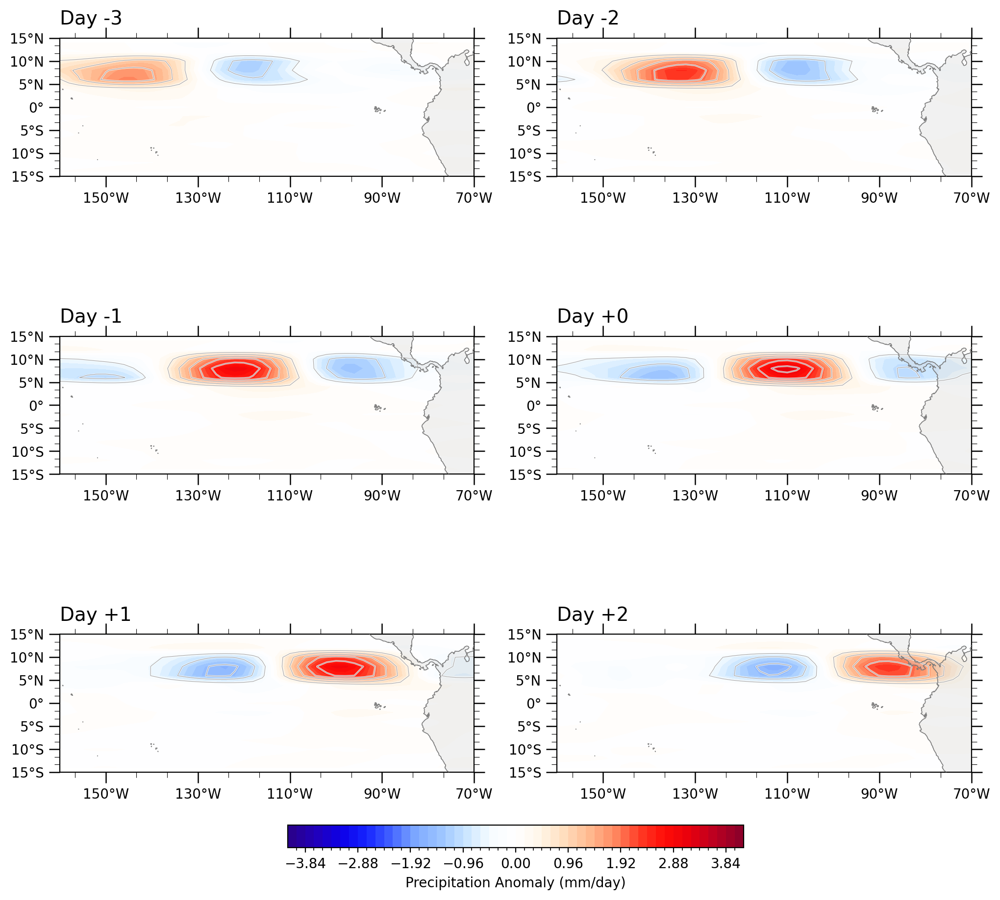

In [17]:
def plot_spatial_composite_3x2(composite, lag_days=[-3, -2, -1, 0, 1, 2],
                              figsize=(12, 14), vmin=-2.0, vmax=2.0):
    """
    绘制单实验的空间分布图，固定 3x2 布局
    使用改进的配色方案和样式
    """
    import matplotlib.patheffects as PathEffects
    try:
        import geocat.viz.util as gvutil
        use_geocat = True
    except ImportError:
        print("⚠️  geocat-viz not available, using basic style")
        use_geocat = False

    nrows, ncols = 3, 2
    total_panels = nrows * ncols

    # 使用中心经度210°的投影
    proj = ccrs.PlateCarree(central_longitude=210)
    fig = plt.figure(figsize=figsize, dpi=200)
    
    # 创建自定义colormap（使用连续插值而不是固定颜色列表）
    newcmp = cmaps.NCV_blu_red
    
    from matplotlib.colors import LinearSegmentedColormap
    # 从 NCV_blu_red 创建连续的 colormap
    colors_blue = [newcmp[i].colors for i in [5, 20, 35, 50, 65, 85, 95, 110, 125]]
    colors_red = [newcmp[i].colors for i in [135, 150, 165, 180, 200, 210, 220, 235, 250]]
    
    # 创建颜色节点：蓝色 -> 白色 -> 红色
    all_colors = colors_blue + [[1., 1., 1.]] + colors_red
    n_colors = len(all_colors)
    color_positions = np.linspace(0, 1, n_colors)
    
    # 创建连续的 colormap
    custom_cmap = LinearSegmentedColormap.from_list('custom_blue_white_red', 
                                                     list(zip(color_positions, all_colors)),
                                                     N=256)
    
    # 设置填色图参数（增加层级数使颜色过渡更平滑）
    levels_fill = np.linspace(vmin, vmax, 51)  # 从21增加到51
    
    # 设置等值线参数（更细更柔和）
    delc = 0.5
    levels_contour = np.arange(-10, 0, delc)
    levels_contour = np.append(levels_contour, np.arange(delc, 10, delc))
    
    ax_list = []
    
    for idx in range(total_panels):
        ax = fig.add_subplot(nrows, ncols, idx + 1, projection=proj)
        ax_list.append(ax)
        
        if idx < len(lag_days):
            lag = lag_days[idx]
            data_lag = composite.sel(lag=lag)
            
            # 添加循环经度以避免间隙
            if use_geocat:
                data_lag = gvutil.xr_add_cyclic_longitudes(data_lag, 'lon')
            
            # 添加海岸线
            ax.coastlines(linewidth=0.5, alpha=0.6)
            
            # 设置坐标范围和刻度 (150°E - 250°E)
            # 由于 central_longitude=210, 150°E对应-60°, 250°E对应+40°
            if use_geocat:
                gvutil.set_axes_limits_and_ticks(ax,
                                               xlim=(-10, 80),
                                               ylim=(-15, 15),
                                               xticks=np.arange(-40, 91, 20),
                                               yticks=np.arange(-15, 16, 5))
                gvutil.add_major_minor_ticks(ax, labelsize=10)
                gvutil.add_lat_lon_ticklabels(ax)
            else:
                ax.set_xlim([-60, 40])
                ax.set_ylim([-15, 15])
                ax.set_xticks(np.arange(-60, 41, 20))
                ax.set_yticks(np.arange(-15, 16, 5))
                ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=False))
                ax.yaxis.set_major_formatter(LatitudeFormatter())
            
            # 绘制填色图
            cf = data_lag.plot.contourf(
                ax=ax,
                levels=levels_fill,
                cmap=custom_cmap,  # 使用连续的 colormap
                add_colorbar=False,
                transform=ccrs.PlateCarree(),
                extend='both',
                add_labels=False 
            )
            
            # 添加陆地和海岸线
            ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2, alpha=0.3)
            ax.add_feature(cfeature.COASTLINE, edgecolor='gray', linewidth=0.5, zorder=3)
            
            # 绘制等值线（更细更柔和的样式）
            contour = data_lag.plot.contour(
                ax=ax,
                levels=levels_contour,
                colors='dimgray',  # 使用更柔和的灰色
                alpha=0.6,  # 降低透明度使其更柔和
                linewidths=0.4,  # 稍微增加线宽但保持细腻
                linestyles='solid',
                add_labels=False,
                transform=ccrs.PlateCarree()
            )
            
            # 添加柔和的白色边缘效果
            try:
                pe = [PathEffects.withStroke(linewidth=1.2, foreground="white", alpha=0.8)]
                if hasattr(contour, 'collections'):
                    for collection in contour.collections:
                        collection.set_path_effects(pe)
                else:
                    # xarray返回的contour对象本身就是collection
                    plt.setp(contour.collections if hasattr(contour, 'collections') else [contour], 
                            path_effects=pe)
            except:
                pass  # 如果设置失败，继续
            
            # 设置标题
            if use_geocat:
                gvutil.set_titles_and_labels(ax,
                                           lefttitle=f'Day {lag:+d}',
                                           lefttitlefontsize=14,
                                           righttitle='',
                                           xlabel="",
                                           ylabel="")
            else:
                ax.set_title(f'Day {lag:+d}', fontsize=14, loc='left')
        
        else:
            # 空白面板
            ax.axis("off")
    
    # 添加颜色棒（更平滑，不显示边缘线）
    fig.colorbar(cf, ax=ax_list,
                 drawedges=False,  # 去掉边缘线使colorbar更平滑
                 orientation='horizontal',
                 shrink=0.5,
                 pad=0.05,
                 extendfrac='auto',
                 extendrect=True,
                 label='Precipitation Anomaly (mm/day)')
    
  
    
    save_path = os.path.join(FIG_SAVE_DIR, "composite_spatial_maps_3x2_improved.png")
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    print(f"💾 Figure saved: {save_path}")

    return fig

# 绘制改进样式的空间分布图
print("\n🎨 Plotting improved spatial composite maps...")
fig_spatial = plot_spatial_composite_3x2(
    pr_composites['CNTL'],   # 单个实验
    lag_days=[-3, -2, -1, 0, 1, 2],
    vmin=-4.0,
    vmax=4.0
)
plt.show()


### 6.3 降水+风场叠加图：超前滞后空间分布

在降水场上叠加81层风场矢量箭头


🎨 Plotting Precipitation + Wind Overlay Maps...

📊 Creating overlay map for CNTL...
  🌬️  Using wind field at level 80
     Approximate pressure: ~300 hPa
💾 Figure saved: ./figures/pr_regression_composite/composite_pr_wind_overlay_cntl.png


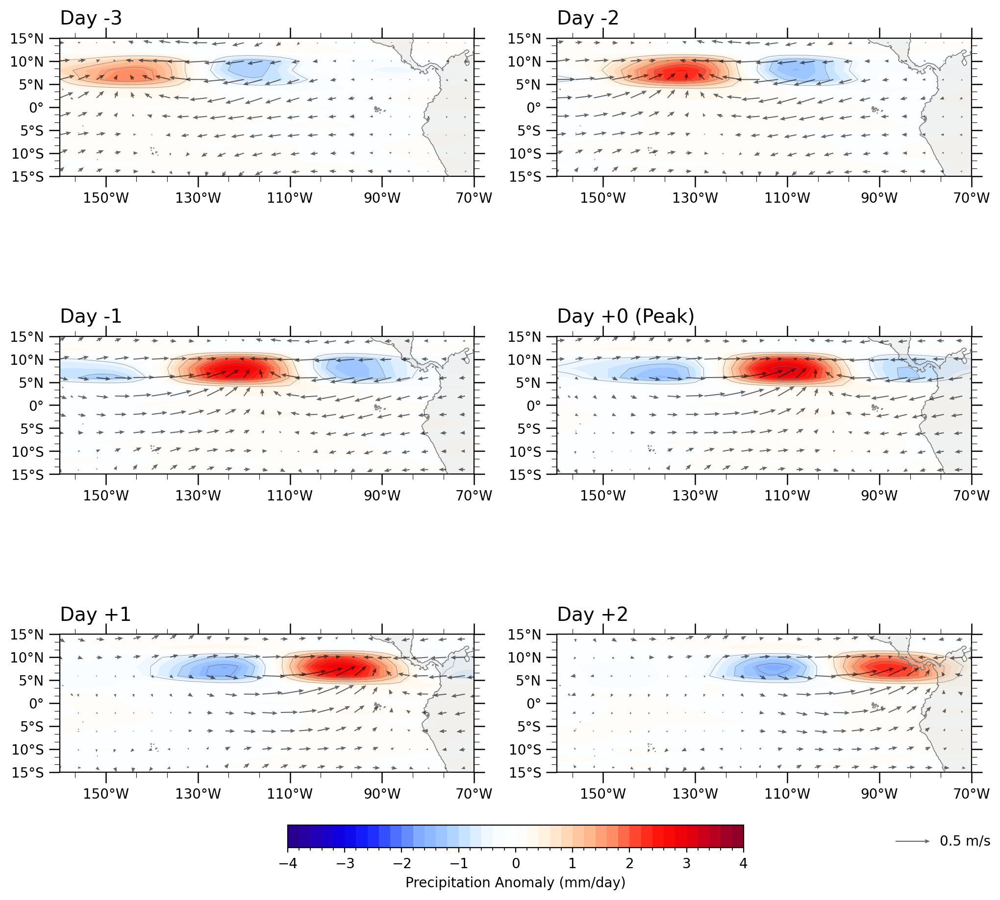

✅ CNTL overlay map complete

📊 Creating overlay map for P4K...
  🌬️  Using wind field at level 80
     Approximate pressure: ~300 hPa
💾 Figure saved: ./figures/pr_regression_composite/composite_pr_wind_overlay_p4k.png


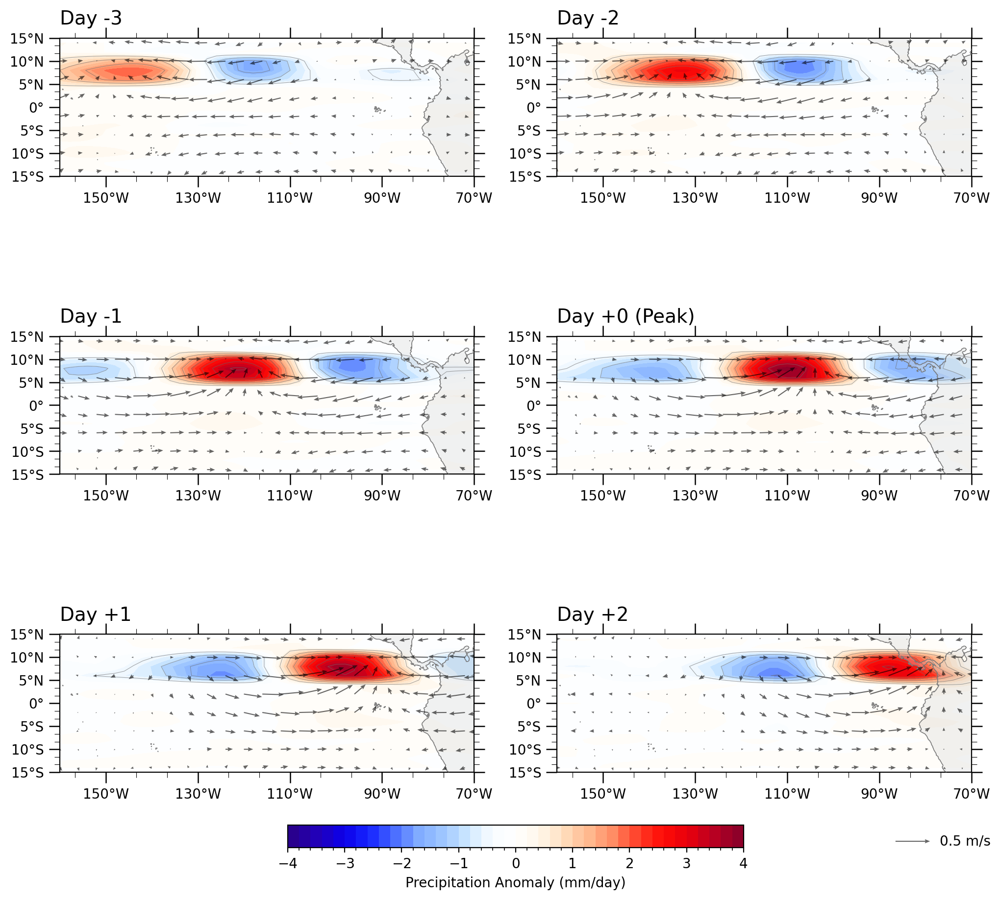

✅ P4K overlay map complete

📊 Creating overlay map for 4CO2...
  🌬️  Using wind field at level 80
     Approximate pressure: ~300 hPa
💾 Figure saved: ./figures/pr_regression_composite/composite_pr_wind_overlay_4co2.png


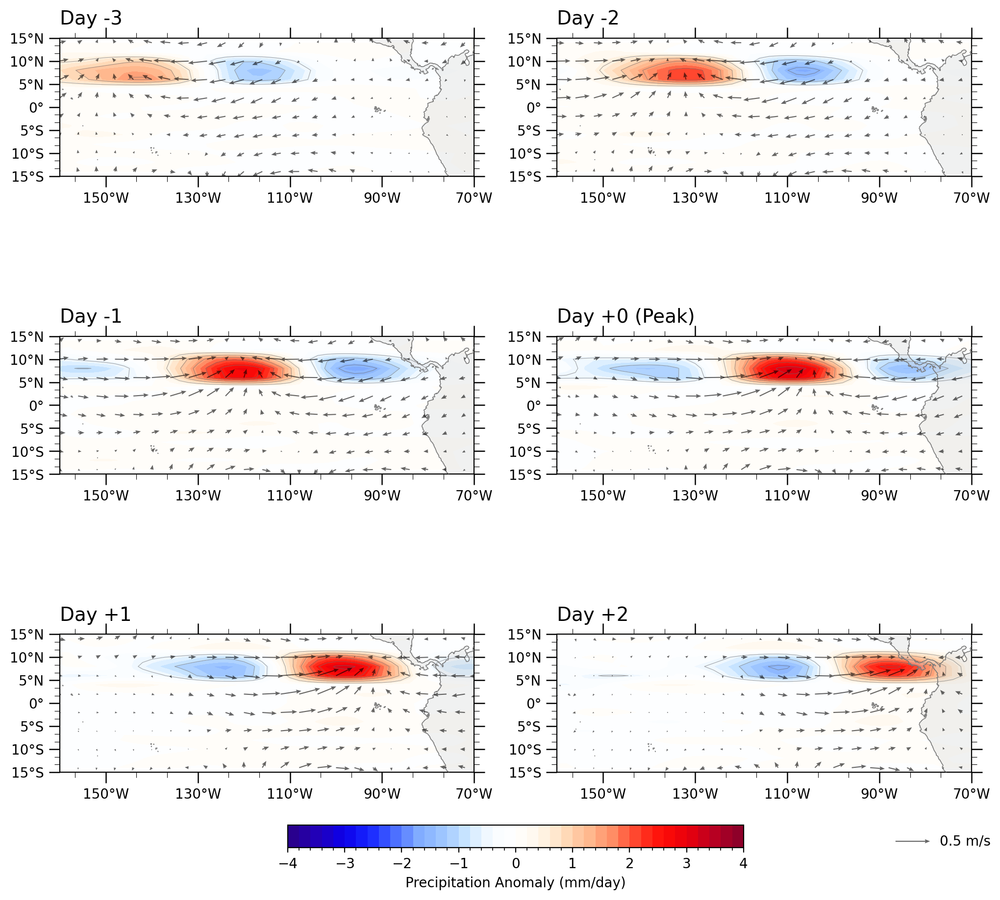

✅ 4CO2 overlay map complete

✅ All overlay maps complete!


In [18]:
def plot_pr_wind_composite_overlay(pr_composite, ua_composite, va_composite, exp_name,
                                   lag_days=[-3, -2, -1, 0, 1, 2],
                                   wind_level=80,  # 新增：选择风场层数
                                   figsize=(12, 14), vmin=-2.0, vmax=2.0,
                                   wind_scale=50, arrow_skip=4, arrow_width=0.002):
    """
    绘制降水场+风场矢量叠加图
    
    Parameters:
    -----------
    pr_composite : xr.DataArray
        降水合成数据
    ua_composite, va_composite : xr.DataArray
        风场合成数据 (包含多个模式层)
    exp_name : str
        实验名称
    lag_days : list
        要绘制的lag天数
    wind_level : int, default=80
        选择的风场层数（可选：31, 35, 38, 41, 46, 51, 55, 58, 63, 67, 71, 
        74, 76, 78, 80, 81, 83, 84, 85, 87, 89, 90）
        - 51层 (~850 hPa): 边界层顶
        - 71层 (~500 hPa): 中对流层
        - 80层 (~300 hPa): 高对流层【默认】
        - 81层 (~250 hPa): 对流层顶
    figsize : tuple
        图像大小
    vmin, vmax : float
        降水场颜色范围
    wind_scale : float
        风矢量缩放因子（越大箭头越短）
    arrow_skip : int
        箭头采样间隔（每N个格点取一个）
    arrow_width : float
        箭头宽度
    """
    import matplotlib.patheffects as PathEffects
    try:
        import geocat.viz.util as gvutil
        use_geocat = True
    except ImportError:
        print("⚠️  geocat-viz not available, using basic style")
        use_geocat = False
    
    # 打印使用的风场层信息
    print(f"  🌬️  Using wind field at level {wind_level}")
    
    # 层数到气压的映射（供参考）
    level_to_pressure = {
        31: "~1000 hPa", 51: "~850 hPa", 71: "~500 hPa", 
        80: "~300 hPa", 81: "~250 hPa", 90: "~100 hPa"
    }
    if wind_level in level_to_pressure:
        print(f"     Approximate pressure: {level_to_pressure[wind_level]}")

    nrows, ncols = 3, 2
    total_panels = nrows * ncols

    # 使用中心经度210°的投影
    proj = ccrs.PlateCarree(central_longitude=210)
    fig = plt.figure(figsize=figsize, dpi=200)
    
    # 创建自定义colormap（降水场）
    newcmp = cmaps.NCV_blu_red
    
    from matplotlib.colors import LinearSegmentedColormap
    colors_blue = [newcmp[i].colors for i in [5, 20, 35, 50, 65, 85, 95, 110, 125]]
    colors_red = [newcmp[i].colors for i in [135, 150, 165, 180, 200, 210, 220, 235, 250]]
    
    all_colors = colors_blue + [[1., 1., 1.]] + colors_red
    n_colors = len(all_colors)
    color_positions = np.linspace(0, 1, n_colors)
    
    custom_cmap = LinearSegmentedColormap.from_list('custom_blue_white_red', 
                                                     list(zip(color_positions, all_colors)),
                                                     N=256)
    
    # 设置填色图参数
    levels_fill = np.linspace(vmin, vmax, 41)
    
    # 设置等值线参数
    delc = 0.5
    levels_contour = np.arange(-10, 0, delc)
    levels_contour = np.append(levels_contour, np.arange(delc, 10, delc))
    
    ax_list = []
    
    for idx in range(total_panels):
        ax = fig.add_subplot(nrows, ncols, idx + 1, projection=proj)
        ax_list.append(ax)
        
        if idx < len(lag_days):
            lag = lag_days[idx]
            
            # 提取该lag的降水数据
            pr_lag = pr_composite.sel(lag=lag)
            
            # 提取该lag的风场数据（选择指定层）
            # 使用method='nearest'确保即使输入的层数不精确也能找到最近的层
            ua_lag = ua_composite.sel(lag=lag, lev=wind_level, method='nearest')
            va_lag = va_composite.sel(lag=lag, lev=wind_level, method='nearest')
            
            # 添加循环经度
            if use_geocat:
                pr_lag = gvutil.xr_add_cyclic_longitudes(pr_lag, 'lon')
            
            # 添加海岸线
            ax.coastlines(linewidth=0.5, alpha=0.6)
            
            # 设置坐标范围和刻度
            if use_geocat:
                gvutil.set_axes_limits_and_ticks(ax,
                                               xlim=(-10, 80),
                                               ylim=(-15, 15),
                                               xticks=np.arange(-40, 91, 20),
                                               yticks=np.arange(-15, 16, 5))
                gvutil.add_major_minor_ticks(ax, labelsize=10)
                gvutil.add_lat_lon_ticklabels(ax)
            else:
                ax.set_xlim([-60, 40])
                ax.set_ylim([-15, 15])
                ax.set_xticks(np.arange(-60, 41, 20))
                ax.set_yticks(np.arange(-15, 16, 5))
                ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=False))
                ax.yaxis.set_major_formatter(LatitudeFormatter())
            
            # 1. 绘制降水填色图
            cf = pr_lag.plot.contourf(
                ax=ax,
                levels=levels_fill,
                cmap=custom_cmap,
                add_colorbar=False,
                transform=ccrs.PlateCarree(),
                extend='neither',
                add_labels=False 
            )
            
            # 2. 添加陆地和海岸线
            ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2, alpha=0.3)
            ax.add_feature(cfeature.COASTLINE, edgecolor='gray', linewidth=0.5, zorder=3)
            
            # 3. 绘制降水等值线
            contour = pr_lag.plot.contour(
                ax=ax,
                levels=levels_contour,
                colors='dimgray',
                alpha=0.6,
                linewidths=0.4,
                linestyles='solid',
                add_labels=False,
                transform=ccrs.PlateCarree()
            )
            
            # 添加等值线白色边缘效果
            try:
                pe = [PathEffects.withStroke(linewidth=1.2, foreground="white", alpha=0.8)]
                if hasattr(contour, 'collections'):
                    for collection in contour.collections:
                        collection.set_path_effects(pe)
            except:
                pass
            
            # 4. 叠加风场矢量
            # 降采样风场数据以避免箭头过于密集
            # 使用isel进行降采样以保持xarray结构
            ua_lag_sampled = ua_lag.isel(lat=slice(None, None, arrow_skip), 
                                          lon=slice(None, None, arrow_skip))
            va_lag_sampled = va_lag.isel(lat=slice(None, None, arrow_skip), 
                                          lon=slice(None, None, arrow_skip))
            
            lon_q = ua_lag_sampled.lon.values
            lat_q = ua_lag_sampled.lat.values
            ua_q = ua_lag_sampled.values
            va_q = va_lag_sampled.values
            
            # 绘制风矢量 - cartopy会自动处理1D坐标到2D网格的转换
            Q = ax.quiver(
                lon_q, lat_q, ua_q, va_q,
                transform=ccrs.PlateCarree(),
                scale=wind_scale,
                width=arrow_width,
                headwidth=4,
                headlength=5,
                color='k',
                alpha=0.6,
                zorder=4  # 确保箭头在最上层
            )
            
            # 设置标题
            title_text = f'Day {lag:+d}'
            if lag == 0:
                title_text += ' (Peak)'
            
            if use_geocat:
                gvutil.set_titles_and_labels(ax,
                                           lefttitle=title_text,
                                           lefttitlefontsize=14,
                                           righttitle='',
                                           xlabel="",
                                           ylabel="")
            else:
                ax.set_title(title_text, fontsize=14, loc='left', fontweight='bold' if lag==0 else 'normal')
        
        else:
            # 空白面板
            ax.axis("off")
    
    # 添加降水颜色棒
    cbar = fig.colorbar(cf, ax=ax_list,
                       drawedges=False,
                       orientation='horizontal',
                       shrink=0.5,
                       pad=0.05,
                       extendfrac='auto',
                       extendrect=True,
                       label='Precipitation Anomaly (mm/day)')
    
    # 添加风矢量参考箭头
    # 在图的右下角添加参考箭头
    qk = ax_list[-1].quiverkey(Q, 0.9, -0.5, 0.5, '0.5 m/s', 
                                labelpos='E', coordinates='axes',
                                fontproperties={'size': 10, })
    
    # 总标题
    exp_title = {'CNTL': 'Control', 'P4K': '+4K SST', '4CO2': '4×CO₂'}.get(exp_name, exp_name)
    
    # 保存图像
    save_path = os.path.join(FIG_SAVE_DIR, f'composite_pr_wind_overlay_{exp_name.lower()}.png')
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    print(f"💾 Figure saved: {save_path}")
    
    return fig


# 为每个实验绘制降水+风场叠加图
print("\n🎨 Plotting Precipitation + Wind Overlay Maps...")
print("="*80)

for exp in EXPERIMENTS:
    if exp in pr_composites and exp in ua_composites and exp in va_composites:
        print(f"\n📊 Creating overlay map for {exp}...")
        
        fig = plot_pr_wind_composite_overlay(
            pr_composite=pr_composites[exp],
            ua_composite=ua_composites[exp],
            va_composite=va_composites[exp],
            exp_name=exp,
            lag_days=[-3, -2, -1, 0, 1, 2],
            wind_level=80,     
            vmin=-4.0,
            vmax=4.0,
            wind_scale=6,       # 调整箭头长度
            arrow_skip=2,       # 每4个格点一个箭头
            arrow_width=0.0025  # 箭头宽度
        )
        plt.show()
        plt.close()
        
        print(f"✅ {exp} overlay map complete")
    else:
        print(f"⚠️  Skipping {exp}: Missing data")

print("\n" + "="*80)
print("✅ All overlay maps complete!")
print("="*80)


🎨 Plotting multi-experiment comparison at Day 0...


💾 Figure saved: ./figures/pr_regression_composite/composite_spatial_multi_exp.png


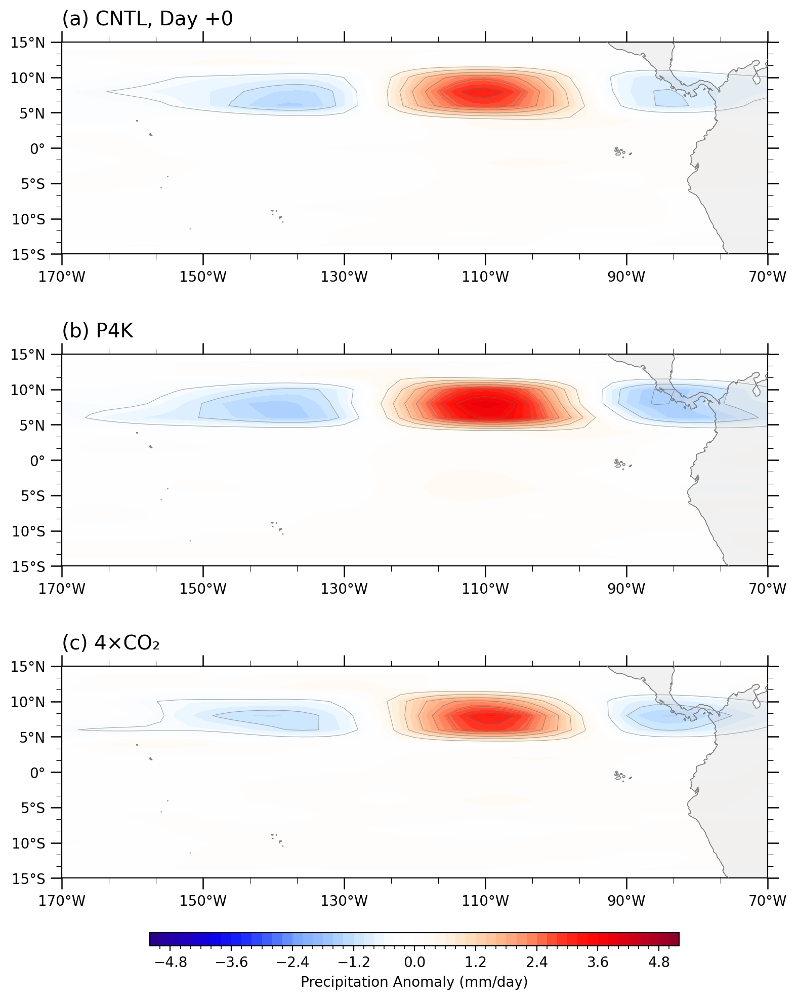

In [20]:
def plot_spatial_composite_multi_exp(composites, experiments=['CNTL', 'P4K', '4CO2'],
                                    lag_days=[0], figsize=(18, 12), vmin=-2.5, vmax=2.5):
    """
    绘制多个实验在特定lag天的空间对比图
    
    Parameters:
    -----------
    composites : dict
        {exp_name: composite_data}
    experiments : list
        实验列表
    lag_days : list
        要绘制的lag天数
    """
    import matplotlib.patheffects as PathEffects
    try:
        import geocat.viz.util as gvutil
        use_geocat = True
    except ImportError:
        print("⚠️  geocat-viz not available, using basic style")
        use_geocat = False
    
    n_exp = len(experiments)
    n_lags = len(lag_days)
    
    # 使用中心经度210°的投影
    proj = ccrs.PlateCarree(central_longitude=210)
    fig = plt.figure(figsize=figsize, dpi=200)
    grid = fig.add_gridspec(ncols=n_lags, nrows=n_exp, hspace=0.25, wspace=0.15)
    
    # 创建自定义colormap（使用连续插值）
    newcmp = cmaps.NCV_blu_red
    
    from matplotlib.colors import LinearSegmentedColormap
    # 从 NCV_blu_red 创建连续的 colormap
    colors_blue = [newcmp[i].colors for i in [5, 20, 35, 50, 65, 85, 95, 110, 125]]
    colors_red = [newcmp[i].colors for i in [135, 150, 165, 180, 200, 210, 220, 235, 250]]
    
    # 创建颜色节点：蓝色 -> 白色 -> 红色
    all_colors = colors_blue + [[1., 1., 1.]] + colors_red
    n_colors = len(all_colors)
    color_positions = np.linspace(0, 1, n_colors)
    
    # 创建连续的 colormap
    custom_cmap = LinearSegmentedColormap.from_list('custom_blue_white_red', 
                                                     list(zip(color_positions, all_colors)),
                                                     N=256)
    
    # 设置参数（增加层级数使颜色过渡更平滑）
    levels_fill = np.linspace(vmin, vmax, 51)  # 从21增加到51
    delc = 0.5
    levels_contour = np.arange(-10, 0, delc)
    levels_contour = np.append(levels_contour, np.arange(delc, 10, delc))
    
    ax_list = []
    exp_labels = ['(a) CNTL', '(b) P4K', r'(c) 4×CO₂']
    
    for i, exp in enumerate(experiments):
        composite = composites[exp]
        
        for j, lag in enumerate(lag_days):
            ax = fig.add_subplot(grid[i, j], projection=proj)
            ax_list.append(ax)
            
            data_lag = composite.sel(lag=lag)
            
            # 添加循环经度
            if use_geocat:
                data_lag = gvutil.xr_add_cyclic_longitudes(data_lag, 'lon')
            
            # 海岸线
            ax.coastlines(linewidth=0.5, alpha=0.6)
            
            # 设置坐标 (150°E - 250°E)
            # 由于 central_longitude=210, 150°E对应-60°, 250°E对应+40°
            if use_geocat:
                gvutil.set_axes_limits_and_ticks(ax,
                                               xlim=(-20, 80),
                                               ylim=(-15, 15),
                                               xticks=np.arange(-60, 81, 20),
                                               yticks=np.arange(-15, 16, 5))
                gvutil.add_major_minor_ticks(ax, labelsize=10)
                gvutil.add_lat_lon_ticklabels(ax)
            else:
                ax.set_xlim([-60, 40])
                ax.set_ylim([-15, 15])
                ax.set_xticks(np.arange(-60, 41, 20))
                ax.set_yticks(np.arange(-15, 16, 5))
                ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=False))
                ax.yaxis.set_major_formatter(LatitudeFormatter())
            
            # 填色图
            cf = data_lag.plot.contourf(
                ax=ax,
                levels=levels_fill,
                cmap=custom_cmap,  # 使用连续的 colormap
                add_colorbar=False,
                transform=ccrs.PlateCarree(),
                extend='both',
                add_labels=False 
            )
            
            # 陆地和海岸
            ax.add_feature(cfeature.LAND, facecolor='lightgray', zorder=2, alpha=0.3)
            ax.add_feature(cfeature.COASTLINE, edgecolor='gray', linewidth=0.5, zorder=3)
            
            # 等值线（更细更柔和的样式）
            contour = data_lag.plot.contour(
                ax=ax,
                levels=levels_contour,
                colors='dimgray',  # 使用更柔和的灰色
                alpha=0.6,  # 降低透明度
                linewidths=0.4,  # 更细的线条
                linestyles='solid',
                add_labels=False,
                transform=ccrs.PlateCarree()
            )
            
            # 添加柔和的白色边缘效果
            try:
                pe = [PathEffects.withStroke(linewidth=1.2, foreground="white", alpha=0.8)]
                if hasattr(contour, 'collections'):
                    for collection in contour.collections:
                        collection.set_path_effects(pe)
            except:
                pass
            
            # 标题
            if j == 0:
                title = f'{exp_labels[i]}'
            else:
                title = ''
            
            if i == 0:
                title = f'Day {lag:+d}' if title == '' else f'{title}, Day {lag:+d}'
            
            if use_geocat:
                gvutil.set_titles_and_labels(ax,
                                           lefttitle=title,
                                           lefttitlefontsize=14,
                                           righttitle='',
                                           xlabel="",
                                           ylabel="")
            else:
                ax.set_title(title, fontsize=14, loc='left')
    
    # 颜色棒（更平滑，不显示边缘线）
    fig.colorbar(cf, ax=ax_list,
                 drawedges=False,  # 去掉边缘线
                 orientation='horizontal',
                 shrink=0.75,
                 pad=0.05,
                 aspect=40,
                 extendfrac='auto',
                 extendrect=True,
                 label='Precipitation Anomaly (mm/day)')
    
    
    save_path = os.path.join(FIG_SAVE_DIR, "composite_spatial_multi_exp.png")
    plt.savefig(save_path, dpi=200, bbox_inches='tight')
    print(f"💾 Figure saved: {save_path}")
    
    return fig

# 绘制多实验对比图（Day 0）
print("\n🎨 Plotting multi-experiment comparison at Day 0...")
fig_multi = plot_spatial_composite_multi_exp(
    pr_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    lag_days=[0],
    vmin=-5,
    vmax=5,
    figsize=(9, 14),
)
plt.show()

### 6.4 显著性检验（可选）

计算复合场的统计显著性

In [21]:
from scipy import stats

def compute_significance(composite_mean, composite_std, n_events, alpha=0.05):
    """
    计算复合场的统计显著性
    
    Parameters:
    -----------
    composite_mean : xr.DataArray
        复合平均场
    composite_std : xr.DataArray
        复合标准差
    n_events : int
        事件数量
    alpha : float
        显著性水平（默认 0.05 即 95% 置信度）
    
    Returns:
    --------
    t_statistic : xr.DataArray
        t 统计量
    p_value : xr.DataArray
        p 值
    significant : xr.DataArray
        是否显著（布尔数组）
    """
    # 计算标准误差
    std_error = composite_std / np.sqrt(n_events)
    
    # 计算 t 统计量
    t_statistic = composite_mean / std_error
    
    # 计算 p 值（双尾检验）
    p_value = xr.apply_ufunc(
        lambda x: 2 * (1 - stats.t.cdf(np.abs(x), df=n_events-1)),
        t_statistic,
        dask='allowed'
    )
    
    # 判断显著性（保持 xarray 类型）
    significant = p_value < alpha
    
    return t_statistic, p_value, significant


# 计算显著性
print("\n" + "="*80)
print("Computing Statistical Significance")
print("="*80)

significance_results = {}

for exp in EXPERIMENTS:
    if exp not in pr_composites or exp not in pr_composites_std:
        continue
    
    print(f"\n📊 {exp}:")
    
    composite_mean = pr_composites[exp]
    composite_std = pr_composites_std[exp]
    n_events = 546 if exp == 'CNTL' else (548 if exp == 'P4K' else 552)
    
    t_stat, p_val, significant = compute_significance(
        composite_mean, composite_std, n_events, alpha=0.05
    )
    
    significance_results[exp] = {
        't_statistic': t_stat,
        'p_value': p_val,
        'significant': significant
    }
    
    # 统计显著性的格点百分比
    total_points = significant.size
    sig_points = int(significant.sum())
    sig_percentage = (sig_points / total_points) * 100
    
    print(f"   Significant grid points: {sig_points} / {total_points} ({sig_percentage:.1f}%)")
    
    # 统计 Day 0 的显著性
    sig_day0 = significant.sel(lag=0)
    sig_day0_count = int(sig_day0.sum())
    sig_day0_pct = (sig_day0_count / sig_day0.size) * 100
    print(f"   Day 0 significant points: {sig_day0_count} / {sig_day0.size} ({sig_day0_pct:.1f}%)")

print("\n" + "="*80)
print("✅ Significance analysis complete")
print("="*80)


Computing Statistical Significance

📊 CNTL:
   Significant grid points: 3172 / 24300 (13.1%)
   Day 0 significant points: 377 / 2700 (14.0%)

📊 P4K:
   Significant grid points: 3642 / 24300 (15.0%)
   Day 0 significant points: 404 / 2700 (15.0%)

📊 4CO2:
   Significant grid points: 3040 / 24300 (12.5%)
   Day 0 significant points: 359 / 2700 (13.3%)

✅ Significance analysis complete


#### 改进版：针对对流中心区域的廓线演变

In [22]:
# 保存复合结果到 NetCDF 文件
COMPOSITE_SAVE_DIR = os.path.join(REGRESSION_CACHE_DIR, "composites")
os.makedirs(COMPOSITE_SAVE_DIR, exist_ok=True)

print("\n" + "="*80)
print("Saving Composite Results")
print("="*80)

for exp in EXPERIMENTS:
    if exp not in pr_composites:
        continue
    
    # 保存复合平均场
    composite_file = os.path.join(COMPOSITE_SAVE_DIR, f'pr_composite_{exp.lower()}.nc')
    pr_composites[exp].to_netcdf(composite_file)
    
    # 保存复合标准差
    std_file = os.path.join(COMPOSITE_SAVE_DIR, f'pr_composite_std_{exp.lower()}.nc')
    pr_composites_std[exp].to_netcdf(std_file)
    
    print(f"✅ {exp}:")
    print(f"   Mean: {composite_file}")
    print(f"   Std:  {std_file}")

# 保存事件信息
import pickle
events_file = os.path.join(REGRESSION_CACHE_DIR, 'detected_events.pkl')
with open(events_file, 'wb') as f:
    pickle.dump(all_events, f)
print(f"\n✅ Events saved: {events_file}")

print("\n" + "="*80)
print("✅ All results saved successfully!")
print("="*80)


Saving Composite Results


✅ CNTL:
   Mean: ./cache/kelvin_wave/pr_regression_composite/composites/pr_composite_cntl.nc
   Std:  ./cache/kelvin_wave/pr_regression_composite/composites/pr_composite_std_cntl.nc
✅ P4K:
   Mean: ./cache/kelvin_wave/pr_regression_composite/composites/pr_composite_p4k.nc
   Std:  ./cache/kelvin_wave/pr_regression_composite/composites/pr_composite_std_p4k.nc
✅ 4CO2:
   Mean: ./cache/kelvin_wave/pr_regression_composite/composites/pr_composite_4co2.nc
   Std:  ./cache/kelvin_wave/pr_regression_composite/composites/pr_composite_std_4co2.nc

✅ Events saved: ./cache/kelvin_wave/pr_regression_composite/detected_events.pkl

✅ All results saved successfully!


### 7.3 绘制wa垂直剖面图（y轴为层数）


🎨 Plotting vertical structure comparison (5 positions)...


💾 Figure saved: ./figures/pr_regression_composite/wa_vertical_structure_day+0.png


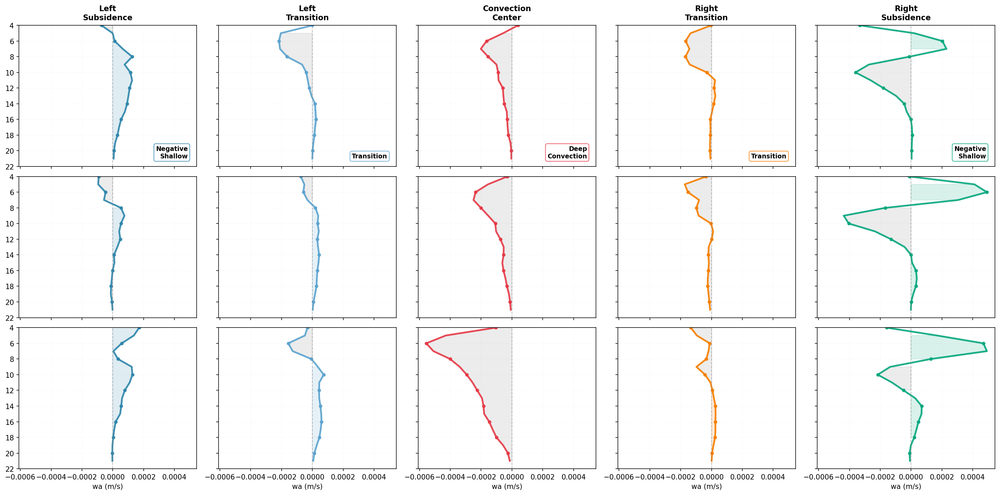


✅ Vertical structure comparison complete!


In [ ]:
# def plot_wa_vertical_structure_comparison(wa_composites, experiments=['CNTL', 'P4K', '4CO2'],
#                                          key_longitudes=None, key_infos=None,
#                                          figsize=(20, 12), lag_day=0):
#     """
#     绘制wa垂直结构对比图 - 显示5个关键经度位置
#     类似参考文献中的垂直结构分类图
    
#     每行一个实验，每列一个经度位置（-2, -1, 0, +1, +2）
#     这样可以看到：
#     - 左侧下沉区 (negative shallow convection)
#     - 过渡区 (bottom-heavy/top-heavy)
#     - 对流中心 (deep convection)
#     - 右侧过渡区 
#     - 右侧下沉区 (suppressed convection)
#     """
#     n_exp = len(experiments)
#     n_pos = 5  # 5个经度位置
    
#     # 创建子图网格
#     fig, axes = plt.subplots(n_exp, n_pos, figsize=figsize, dpi=150, 
#                             sharex=True, sharey=True)
    
#     if n_exp == 1:
#         axes = axes.reshape(1, -1)
    
#     # 定义5个位置的标签和颜色
#     positions = [-2, -1, 0, 1, 2]
#     position_labels = {
#         -2: 'Left\nSubsidence',
#         -1: 'Left\nTransition',
#          0: 'Convection\nCenter',
#          1: 'Right\nTransition',
#          2: 'Right\nSubsidence'
#     }
    
#     position_colors = {
#         -2: '#2E86AB',  # 深蓝
#         -1: '#5BA3CF',  # 蓝色
#          0: '#E63946',  # 红色
#          1: '#F77F00',  # 橙色
#          2: '#06A77D',  # 绿色
#     }
    
#     exp_titles = {'CNTL': 'Control', 'P4K': '+4K SST', '4CO2': '4×CO₂'}
    
#     for i, exp in enumerate(experiments):
#         if exp not in wa_composites:
#             continue
        
#         wa_comp = wa_composites[exp]
        
#         # 检查维度名称
#         if 'level' in wa_comp.dims:
#             level_dim = 'level'
#         elif 'lev' in wa_comp.dims:
#             level_dim = 'lev'
#         else:
#             print(f"⚠️  Warning: No level dimension found for {exp}")
#             continue
        
#         # 获取层数值
#         levels = wa_comp[level_dim].values
        
#         # 获取该实验的关键经度
#         if key_longitudes and exp in key_longitudes:
#             lons = key_longitudes[exp]
#             lat_range = key_infos[exp]['lat_range'] if key_infos and exp in key_infos else (-5, 5)
#             lon_buffer = key_infos[exp]['lon_buffer'] if key_infos and exp in key_infos else 2.5
#         else:
#             # 默认使用简单的5个位置
#             center_lon = 180
#             lons = {-2: center_lon-40, -1: center_lon-20, 0: center_lon, 
#                     1: center_lon+20, 2: center_lon+40}
#             lat_range = (-5, 5)
#             lon_buffer = 2.5
        
#         # 对每个经度位置绘制垂直剖面
#         for j, pos in enumerate(positions):
#             ax = axes[i, j]
            
#             lon_target = lons[pos]
            
#             # 选择指定lag的数据
#             wa_lag = wa_comp.sel(lag=lag_day)
            
#             # 提取该经度附近的区域并平均
#             wa_profile = wa_lag.sel(
#                 lat=slice(*lat_range),
#                 lon=slice(lon_target - lon_buffer, lon_target + lon_buffer)
#             ).mean(dim=['lat', 'lon'])
            
#             # 绘制垂直剖面
#             ax.plot(wa_profile.values, 
#                    range(len(levels)),
#                    color=position_colors[pos],
#                    linewidth=2.5,
#                    linestyle='-',
#                    alpha=0.9,
#                    marker='o',
#                    markersize=4,
#                    markevery=2)
            
#             # 添加零线
#             ax.axvline(0, color='gray', linestyle='--', linewidth=1.0, alpha=0.5)
            
#             # 添加填充区域以突出上升/下沉
#             if wa_profile.values.max() > 0:
#                 ax.fill_betweenx(range(len(levels)), 0, wa_profile.values,
#                                where=(wa_profile.values > 0),
#                                color=position_colors[pos], alpha=0.15,
#                                label='Ascent' if j == 0 and i == 0 else '')
#             if wa_profile.values.min() < 0:
#                 ax.fill_betweenx(range(len(levels)), 0, wa_profile.values,
#                                where=(wa_profile.values < 0),
#                                color='gray', alpha=0.15,
#                                label='Descent' if j == 0 and i == 0 else '')
            
#             # 设置y轴
           
#             ax.invert_yaxis()
#             ax.set_ylim(22,4)
            
#             if i == n_exp - 1:  # 只在底部显示x轴标签
#                 ax.set_xlabel('wa (m/s)', fontsize=10)
            
#             # 标题
#             if i == 0:
#                 ax.set_title(position_labels[pos], fontsize=11, fontweight='bold', pad=8)
            
#             # 网格
#             ax.grid(True, alpha=0.2, linestyle=':', linewidth=0.5)
            
#             # 在子图上添加文本注释，标注垂直结构类型
#             if i == 0:  # 只在第一行添加
#                 # 判断垂直结构类型
#                 max_level = wa_profile.values.argmax()
#                 min_level = wa_profile.values.argmin()
#                 upper_half = len(levels) // 2
                
#                 if pos == 0:  # 对流中心
#                     structure_type = 'Deep\nConvection'
#                 elif pos in [-2, 2]:  # 两侧下沉区
#                     if max_level < upper_half:  # 上层上升
#                         structure_type = 'Negative\nShallow'
#                     else:
#                         structure_type = 'Suppressed'
#                 else:  # 过渡区
#                     if wa_profile.values.max() > abs(wa_profile.values.min()):
#                         if max_level < upper_half:
#                             structure_type = 'Top-heavy'
#                         else:
#                             structure_type = 'Bottom-heavy'
#                     else:
#                         structure_type = 'Transition'
                
#                 ax.text(0.95, 0.05, structure_type, 
#                        transform=ax.transAxes,
#                        fontsize=9, fontweight='bold',
#                        ha='right', va='bottom',
#                        bbox=dict(boxstyle='round,pad=0.3', 
#                                facecolor='white', 
#                                edgecolor=position_colors[pos],
#                                alpha=0.8))
    
    
#     plt.tight_layout(rect=[0, 0, 1, 0.99])
    
#     # 保存图像
#     save_path = os.path.join(FIG_SAVE_DIR, f'wa_vertical_structure_day{lag_day:+d}.png')
#     plt.savefig(save_path, dpi=200, bbox_inches='tight')
#     print(f"💾 Figure saved: {save_path}")
    
#     return fig


# # 绘制Day 0的垂直结构对比图
# if 'wa_composites' in locals() or 'wa_composites' in globals():
#     print("\n🎨 Plotting vertical structure comparison (5 positions)...")
#     print("="*80)
    
#     fig_structure = plot_wa_vertical_structure_comparison(
#         wa_composites=wa_composites,
#         experiments=['CNTL', 'P4K', '4CO2'],
#         key_longitudes=key_longitudes if 'key_longitudes' in locals() else None,
#         key_infos=key_infos if 'key_infos' in locals() else None,
#         figsize=(20, 10),
#         lag_day=0
#     )
#     plt.show()
    
#     print("\n" + "="*80)
#     print("✅ Vertical structure comparison complete!")
#     print("="*80)
# else:
#     print("⚠️  wa_composites not found. Please run the wa composite analysis first.")

In [24]:
def analyze_convection_structure(wa_composite, ua_composite, lag=0, 
                               lat_range=(-5, 5), lon_range=(140, 260)):
    """
    分析Kelvin波的对流结构，找出关键经度位置
    
    返回建议的经度位置及其特征
    """
    # 平均lat
    wa_lag = wa_composite.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
    ua_lag = ua_composite.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
    
    lon = wa_lag.lon.values
    if 'level' in wa_lag.dims:
        level_dim = 'level'
    else:
        level_dim = 'lev'
    
    # 计算每个经度的垂直平均wa（整层平均）
    wa_vertical_mean = wa_lag.mean(dim=level_dim).values
    
    # 计算每个经度的垂直积分（上层-下层差异）
    n_levels = len(wa_lag[level_dim])
    upper_levels = slice(0, n_levels//3)  # 上层1/3
    lower_levels = slice(2*n_levels//3, None)  # 下层1/3
    
    wa_upper = wa_lag.isel({level_dim: upper_levels}).mean(dim=level_dim).values
    wa_lower = wa_lag.isel({level_dim: lower_levels}).mean(dim=level_dim).values
    
    # 找出关键位置
    results = {}
    
    # 1. 对流中心：wa最大值
    center_idx = np.argmax(wa_vertical_mean)
    results['convection_center'] = {
        'lon': lon[center_idx],
        'wa_mean': wa_vertical_mean[center_idx],
        'wa_upper': wa_upper[center_idx],
        'wa_lower': wa_lower[center_idx],
        'type': 'Top-heavy' if wa_upper[center_idx] > wa_lower[center_idx] else 'Bottom-heavy'
    }
    
    # 2. 西侧下沉区：在对流中心以西，wa最小值
    west_idx = np.argmin(wa_vertical_mean[:center_idx]) if center_idx > 0 else 0
    results['west_subsidence'] = {
        'lon': lon[west_idx],
        'wa_mean': wa_vertical_mean[west_idx],
        'wa_upper': wa_upper[west_idx],
        'wa_lower': wa_lower[west_idx],
        'type': 'Subsidence'
    }
    
    # 3. 东侧下沉区：在对流中心以东，wa最小值
    east_idx = center_idx + np.argmin(wa_vertical_mean[center_idx:])
    results['east_subsidence'] = {
        'lon': lon[east_idx],
        'wa_mean': wa_vertical_mean[east_idx],
        'wa_upper': wa_upper[east_idx],
        'wa_lower': wa_lower[east_idx],
        'type': 'Subsidence'
    }
    
    # 4. 西侧过渡区：西侧下沉和中心之间
    west_trans_idx = (west_idx + center_idx) // 2
    results['west_transition'] = {
        'lon': lon[west_trans_idx],
        'wa_mean': wa_vertical_mean[west_trans_idx],
        'wa_upper': wa_upper[west_trans_idx],
        'wa_lower': wa_lower[west_trans_idx],
        'type': 'Shallow convection' if wa_lower[west_trans_idx] > 0 else 'Weak convection'
    }
    
    # 5. 东侧过渡区：中心和东侧下沉之间
    east_trans_idx = (center_idx + east_idx) // 2
    results['east_transition'] = {
        'lon': lon[east_trans_idx],
        'wa_mean': wa_vertical_mean[east_trans_idx],
        'wa_upper': wa_upper[east_trans_idx],
        'wa_lower': wa_lower[east_trans_idx],
        'type': 'Decaying convection' if wa_vertical_mean[east_trans_idx] > 0 else 'Transition'
    }
    
    return results

# 对Day 0进行分析
print("🔍 Analyzing convection structure at Day 0...")
print("="*80)

for exp in ['CNTL', 'P4K', '4CO2']:
    print(f"\n📊 {exp}:")
    print("-"*80)
    
    results = analyze_convection_structure(
        wa_composites[exp], 
        ua_composites[exp],
        lag=0,
        lat_range=(-5, 5),
        lon_range=(140, 260)
    )
    
    for pos_name, pos_data in results.items():
        print(f"\n  {pos_name.replace('_', ' ').title()}:")
        print(f"    Longitude: {pos_data['lon']:.1f}°E")
        print(f"    Type: {pos_data['type']}")
        print(f"    wa_mean: {pos_data['wa_mean']*1000:.3f} mm/s")
        print(f"    wa_upper: {pos_data['wa_upper']*1000:.3f} mm/s")
        print(f"    wa_lower: {pos_data['wa_lower']*1000:.3f} mm/s")

print("\n" + "="*80)
print("✅ Analysis complete!")

🔍 Analyzing convection structure at Day 0...

📊 CNTL:
--------------------------------------------------------------------------------

  Convection Center:
    Longitude: 254.0°E
    Type: Top-heavy
    wa_mean: 0.166 mm/s
    wa_upper: 0.066 mm/s
    wa_lower: 0.042 mm/s

  West Subsidence:
    Longitude: 168.0°E
    Type: Subsidence
    wa_mean: -0.057 mm/s
    wa_upper: -0.084 mm/s
    wa_lower: 0.012 mm/s

  East Subsidence:
    Longitude: 260.0°E
    Type: Subsidence
    wa_mean: 0.140 mm/s
    wa_upper: 0.025 mm/s
    wa_lower: 0.064 mm/s

  West Transition:
    Longitude: 210.0°E
    Type: Weak convection
    wa_mean: -0.038 mm/s
    wa_upper: -0.029 mm/s
    wa_lower: -0.004 mm/s

  East Transition:
    Longitude: 256.0°E
    Type: Decaying convection
    wa_mean: 0.163 mm/s
    wa_upper: 0.052 mm/s
    wa_lower: 0.051 mm/s

📊 P4K:
--------------------------------------------------------------------------------

  Convection Center:
    Longitude: 250.0°E
    Type: Bottom-heav


🎨 Plotting longitude-level cross-sections with wind arrows...

📊 Processing Day +0...
<xarray.DataArray ()> Size: 8B
array(-0.11191432)
Coordinates:
    lag      int64 8B 0 <xarray.DataArray ()> Size: 8B
array(0.2849634)
Coordinates:
    lag      int64 8B 0
<xarray.DataArray ()> Size: 8B
array(-0.16750685)
Coordinates:
    lag      int64 8B 0 <xarray.DataArray ()> Size: 8B
array(0.33056571)
Coordinates:
    lag      int64 8B 0
<xarray.DataArray ()> Size: 8B
array(-0.15711414)
Coordinates:
    lag      int64 8B 0 <xarray.DataArray ()> Size: 8B
array(0.2850745)
Coordinates:
    lag      int64 8B 0


💾 Figure saved: ./figures/pr_regression_composite/lon_level_section_arrows_day.png


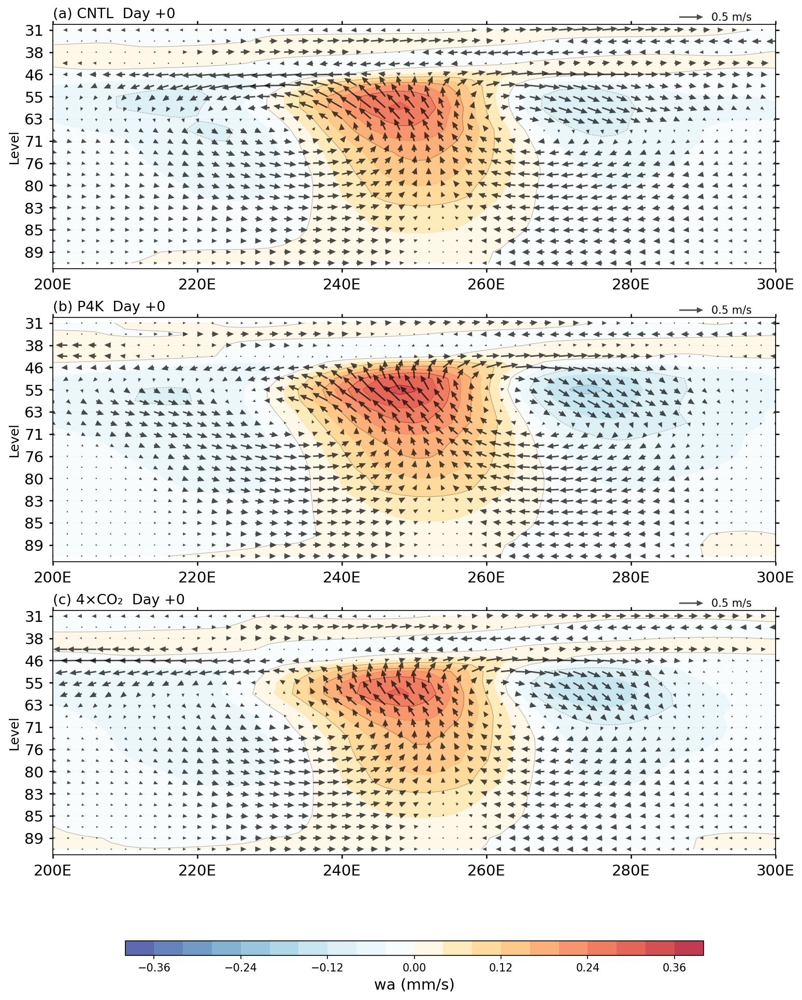


✅ Longitude-level cross-sections complete!


In [25]:
# 绘制经度-层高度剖面图（带风场箭头）
print("\n🎨 Plotting longitude-level cross-sections with wind arrows...")
print("="*80)

def plot_lon_level_section_with_arrows(wa_composites, ua_composites, experiments=['CNTL', 'P4K', '4CO2'],
                                        lag=0, lat_range=(-5, 5), lon_range=(100, 200),
                                        arrow_density=5, figsize=(18, 12),wind_scale=50, arrow_skip=4, arrow_width=0.002):
    """
    绘制经度-层高度剖面图，叠加风场箭头（ua, wa）
    
    Parameters:
    -----------
    wa_composites : dict
        垂直速度合成数据
    ua_composites : dict
        纬向风合成数据
    experiments : list
        实验名称列表
    lag : int
        滞后天数
    lat_range : tuple
        纬度范围用于平均
    lon_range : tuple
        经度范围
    arrow_density : int
        箭头密度（每隔多少个格点绘制一个箭头）
    """
    fig, axes = plt.subplots(len(experiments), 1, figsize=figsize, dpi=150)
    
    if len(experiments) == 1:
        axes = [axes]
    titles =['(a) CNTL', '(b) P4K', '(c) 4×CO₂']
    exp_titles = {'CNTL': 'Control', 'P4K': '+4K SST', '4CO2': '4×CO₂'}
    
    for i, exp in enumerate(experiments):
        ax = axes[i]
        
        if exp not in wa_composites or exp not in ua_composites:
            continue
        
        wa_comp = wa_composites[exp]
        ua_comp = ua_composites[exp]
        
        # 检查level维度
        if 'level' in wa_comp.dims:
            level_dim = 'level'
        elif 'lev' in wa_comp.dims:
            level_dim = 'lev'
        else:
            continue
        
        # 选择数据：指定lag，纬度平均，经度范围
        wa_data = wa_comp.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
        ua_data = ua_comp.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
        
        # 转换单位：wa从Pa/s转为mm/s, ua保持m/s
        wa_plot = wa_data*100
        ua_plot = ua_data
        print(wa_plot.min(),wa_plot.max())
        # 准备绘图坐标
        lon_vals = wa_data.lon.values
        level_vals = wa_data[level_dim].values
        level_indices = np.arange(len(level_vals))
        
        # 创建网格
        LON, LEV = np.meshgrid(lon_vals, level_indices)
        
        # 绘制wa填色图
        levels_contour = np.linspace(-0.4, 0.4, 21)
        
        # 使用更合适的colormap
        from matplotlib.colors import LinearSegmentedColormap
        colors_list = ['#313695', '#4575b4', '#74add1', '#abd9e9', '#e0f3f8', 'white',
                       '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026']
        mycmap = LinearSegmentedColormap.from_list('wa_cmap', colors_list)
        
        cf = ax.contourf(LON, LEV, wa_plot.values, levels=levels_contour, 
                        cmap=mycmap, extend='neither', alpha=0.8)
        
        # 添加等值线
        cs = ax.contour(LON, LEV, wa_plot.values, levels=levels_contour[::2], 
                       colors='k', linewidths=0.5, alpha=0.3)
        
        # 绘制风场箭头（ua, wa）
        # 对箭头数据进行降采样
        LON_arrow = LON[::arrow_density, ::arrow_density]
        LEV_arrow = LEV[::arrow_density, ::arrow_density]
        UA_arrow = ua_plot.values[::arrow_density, ::arrow_density]
        WA_arrow = wa_plot.values[::arrow_density, ::arrow_density]
        
        # 缩放wa使箭头比例合适（wa通常比ua小很多）
        # 调整比例因子以使箭头看起来合理
        wa_scale_factor =1  # 可以调整这个值
        
        
        Q = ax.quiver(
                LON_arrow, LEV_arrow, UA_arrow, WA_arrow * wa_scale_factor,
                scale=wind_scale,
                width=arrow_width,
                headwidth=4,
                headlength=4.5,
                color='k',
                alpha=0.7,
                zorder=4  # 确保箭头在最上层
            )
        # 添加箭头图例
        qk = ax.quiverkey(Q, 0.9, 1.03, 0.5, '0.5 m/s', labelpos='E', coordinates='axes')
        
        # 设置y轴
        ax.set_ylim(-0.5, len(level_vals)-0.5)
        ax.invert_yaxis()
        # ax.set_yscale('symlog')
        
        # y轴刻度：显示level值
        tick_interval = max(1, len(level_vals) // 10)
        tick_positions = range(0, len(level_vals), tick_interval)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels([f"{int(level_vals[j])}" for j in tick_positions])
        
        def east_longitude_formatter(x, pos):
            # x 是刻度值（0–360 都保持）
            val = x % 360
            return f"{int(val)}E"

        # ax = plt.gca()  # 或你的 ax
        ax.xaxis.set_major_formatter(east_longitude_formatter)
        
        # x轴刻度
        ax.set_xticks(np.arange(lon_range[0], lon_range[1]+1, 20))
        
        # 标签和标题
       
        ax.set_ylabel('Level', fontsize=12)
        ax.set_title(f"{titles[i]}  Day {lag:+d}", 
                    fontsize=13, loc='left')
        ax.grid(True, alpha=0.2, linestyle=':', linewidth=0.5)
        
        # 添加colorbar
        if i == len(experiments) - 1:
            cbar = plt.colorbar(cf, ax=axes, orientation='horizontal', 
                               pad=0.08, aspect=40, shrink=0.8)
            cbar.set_label('wa (mm/s)', fontsize=14)
    
        ax.tick_params(    which='both',direction='out',
               width=1.2,
                    pad=5, 
                    labelsize=14,
                    bottom=True, left=True, right=True, top=True)
    
    # 保存图片
    save_path = f'./figures/pr_regression_composite/lon_level_section_arrows_day.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"💾 Figure saved: {save_path}")
    
    return fig

# 绘制不同lag days的经度-层高度剖面
for lag_day in [ 0, ]:
    print(f"\n📊 Processing Day {lag_day:+d}...")
    fig = plot_lon_level_section_with_arrows(
        wa_composites=wa_composites,
        ua_composites=ua_composites,
        experiments=['CNTL', 'P4K', '4CO2'],
        lag=lag_day,
        lat_range=(5, 15),
        lon_range=(200, 300),  # 更宽的经度范围
        arrow_density=1,
        figsize=(12, 18),
        wind_scale=15, 
        arrow_skip=8, 
        arrow_width=0.002
    )
    plt.show()
    plt.close()

print("\n" + "="*80)
print("✅ Longitude-level cross-sections complete!")
print("="*80)

计算所有实验的统一异常中心位置...
  正异常中心: 250.0°E
  左侧负异常: 220.0°E
  右侧负异常: 276.0°E


Saved to: ./figures/kelvin_lon_level_section.png


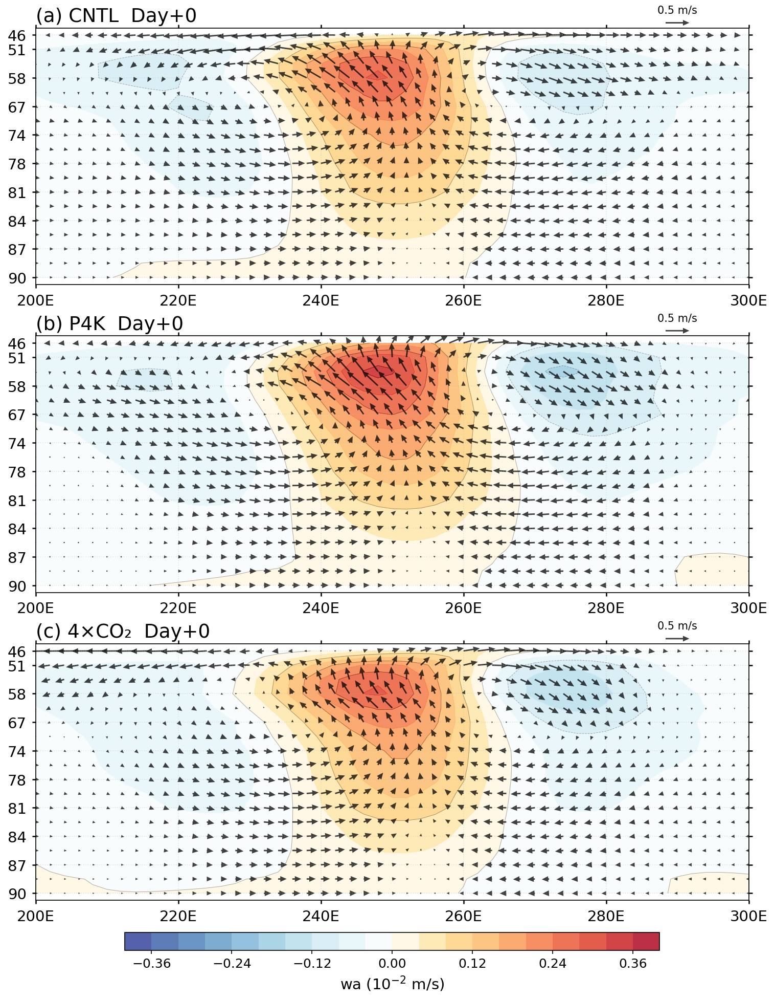

In [26]:
def plot_lon_level_section_with_arrows(
        wa_composites, ua_composites,
        experiments=['CNTL', 'P4K', '4CO2'],
        lag=0, lat_range=(-5, 5), lon_range=(100, 200),
        arrow_density=5, figsize=(18, 12),
        wind_scale=50, arrow_width=0.002,
        center_lon=None, left_lon=None, right_lon=None,
        use_common_center=True):
    """
    绘制经度-高度剖面图，带有风场箭头和异常中心标记
    
    参数:
    --------
    center_lon : float, optional
        手动指定正异常中心经度。如果为None，则自动计算
    left_lon : float, optional
        手动指定左侧负异常中心经度。如果为None，则自动计算
    right_lon : float, optional
        手动指定右侧负异常中心经度。如果为None，则自动计算
    use_common_center : bool, default=True
        如果为True，则使用所有实验的平均值计算统一的异常中心
        如果为False，则每个实验单独计算（不推荐，不利于对比）
    """
    
    # 导入必要的库（放在函数开头）
    from matplotlib.colors import LinearSegmentedColormap
    titles =['(a) CNTL', '(b) P4K', '(c) 4×CO₂']
    fig, axes = plt.subplots(len(experiments), 1, figsize=figsize, dpi=150)
    if len(experiments) == 1:
        axes = [axes]
    
    # 如果没有手动指定中心位置且use_common_center=True，则计算所有实验的平均异常中心
    if use_common_center and (center_lon is None or left_lon is None or right_lon is None):
        print("计算所有实验的统一异常中心位置...")
        all_vertical_means = []
        
        for exp in experiments:
            wa_da = wa_composites[exp]
            if 'level' in wa_da.dims:
                wa_level_dim = 'level'
            elif 'lev' in wa_da.dims:
                wa_level_dim = 'lev'
            else:
                raise KeyError(f"Vertical dimension not found in wa_da.dims={wa_da.dims}")
            
            wa_data = (
                wa_da
                .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
                .sel({wa_level_dim: slice(46, 90)})
                .mean(dim='lat')
            )
            wa_plot = wa_data * 100  # Pa/s → mm/s
            vertical_mean = np.nanmean(wa_plot.values, axis=0)
            all_vertical_means.append(vertical_mean)
        
        # 计算所有实验的平均垂直廓线
        common_vertical_mean = np.nanmean(all_vertical_means, axis=0)
        lon_vals = wa_data.lon.values
        
        # 计算统一的中心位置
        if center_lon is None and len(common_vertical_mean) > 0:
            center_lon_idx = np.nanargmax(common_vertical_mean)
            center_lon = lon_vals[center_lon_idx]
            print(f"  正异常中心: {center_lon:.1f}°E")
        
        if left_lon is None and center_lon is not None:
            center_lon_idx = np.argmin(np.abs(lon_vals - center_lon))
            if center_lon_idx > 10:
                left_mean = common_vertical_mean[:center_lon_idx-5]
                if len(left_mean) > 0 and np.any(left_mean < 0):
                    left_min_idx = np.nanargmin(left_mean)
                    left_lon = lon_vals[left_min_idx]
                    print(f"  左侧负异常: {left_lon:.1f}°E")
        
        if right_lon is None and center_lon is not None:
            center_lon_idx = np.argmin(np.abs(lon_vals - center_lon))
            if center_lon_idx < len(common_vertical_mean) - 10:
                right_mean = common_vertical_mean[center_lon_idx+5:]
                if len(right_mean) > 0 and np.any(right_mean < 0):
                    right_min_idx = np.nanargmin(right_mean) + center_lon_idx + 5
                    right_lon = lon_vals[right_min_idx]
                    print(f"  右侧负异常: {right_lon:.1f}°E")

    for i, exp in enumerate(experiments):
        ax = axes[i]

        # wa_composites[exp] 和 ua_composites[exp] 都是 DataArray
        wa_da = wa_composites[exp]
        ua_da = ua_composites[exp]

        # 自动识别垂直维度名（分别检测wa和ua的维度）
        if 'level' in wa_da.dims:
            wa_level_dim = 'level'
        elif 'lev' in wa_da.dims:
            wa_level_dim = 'lev'
        else:
            raise KeyError(
                f"Vertical dimension not found in wa_da.dims={wa_da.dims}, expected 'level' or 'lev'"
            )
        
        if 'level' in ua_da.dims:
            ua_level_dim = 'level'
        elif 'lev' in ua_da.dims:
            ua_level_dim = 'lev'
        else:
            raise KeyError(
                f"Vertical dimension not found in ua_da.dims={ua_da.dims}, expected 'level' or 'lev'"
            )

        # 数据选择：lag, lat, lon, 以及层裁剪 46–90
        wa_data = (
            wa_da
            .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
            .sel({wa_level_dim: slice(46, 90)})
            .mean(dim='lat')
        )

        ua_data = (
            ua_da
            .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
            .sel({ua_level_dim: slice(46, 90)})
            .mean(dim='lat')
        )

        # 单位处理
        wa_plot = wa_data * 100     # Pa/s → mm/s

        ax.tick_params(    which='both',direction='out',
               width=1.2,
                    pad=5, 
                    labelsize=14,
                    bottom=True, left=True, right=True, top=True)
        # 坐标准备（使用wa的维度名）
        lon_vals = wa_data.lon.values
        level_vals = wa_data[wa_level_dim].values
        level_idx = np.arange(len(level_vals))
        LON, LEV = np.meshgrid(lon_vals, level_idx)

        # colormap & contour
        colors_list = [
            '#313695', '#4575b4', '#74add1', '#abd9e9', '#e0f3f8',
            'white',
            '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026'
        ]
        cmap = LinearSegmentedColormap.from_list('wa_cmap', colors_list)

        levels = np.linspace(-0.4, 0.4, 21)

        cf = ax.contourf(LON, LEV, wa_plot.values, levels, cmap=cmap, alpha=0.85)
        ax.contour(LON, LEV, wa_plot.values, levels[::2], colors='k', alpha=0.3, linewidths=0.5)
      
        # 风场箭头
        LON_q = LON[::arrow_density, ::arrow_density]
        LEV_q = LEV[::arrow_density, ::arrow_density]
        UA_q = ua_data.values[::arrow_density, ::arrow_density]
        WA_q = wa_plot.values[::arrow_density, ::arrow_density]

        Q = ax.quiver(
            LON_q, LEV_q,
            UA_q, WA_q,
            scale=wind_scale,
            width=arrow_width,
            headwidth=4, headlength=4.5,
            color='k', alpha=0.75
        )

        ax.quiverkey(Q, 0.9, 1.02, 0.5, "0.5 m/s", coordinates='axes')

        # y 轴: 改为 hPa
        ax.set_ylim(-0.5, len(level_vals) - 0.5)
        ax.invert_yaxis()
        yticks = np.linspace(0, len(level_vals)-1, 10, dtype=int)
        ax.set_yticks(yticks)
        ax.set_yticklabels([f"{int(level_vals[j])}" for j in yticks])
        from cartopy.mpl.ticker import LongitudeFormatter
        # ax.xaxis.set_major_formatter(LongitudeFormatter())
        def east_longitude_formatter(x, pos):
            # x 是刻度值（0–360 都保持）
            val = x % 360
            return f"{int(val)}E"

        # ax = plt.gca()  # 或你的 ax
        ax.xaxis.set_major_formatter(east_longitude_formatter)
        
        ax.set_title(f"{titles[i]}  Day{lag:+d}", loc='left',fontsize=18)
        ax.grid(True, linestyle=':', alpha=0.3)
        
        # 绘制统一的异常中心垂直线（所有实验使用相同位置）
        # 不在循环中添加label，避免重复
       
        
        if i == len(experiments)-1:
            cbar = plt.colorbar(cf, ax=axes, orientation='horizontal', pad=0.03, aspect=30,shrink=0.75)
            cbar.set_label(r"wa ($10^{-2}$ m/s)", fontsize=14)
            cbar.ax.tick_params(labelsize=12)
    
    # 在所有子图绘制完成后，在图的底部添加统一的图例
    # if center_lon is not None or left_lon is not None or right_lon is not None:
    #     from matplotlib.lines import Line2D
    #     legend_elements = []
        
    #     if center_lon is not None:
    #         legend_elements.append(Line2D([0], [0], color='red', linestyle='--', 
    #                                      linewidth=2.5, label=f'Positive center ({center_lon:.1f}°E)'))
    #     if left_lon is not None:
    #         legend_elements.append(Line2D([0], [0], color='blue', linestyle='--', 
    #                                      linewidth=2.5, label=f'Negative left ({left_lon:.1f}°E)'))
    #     if right_lon is not None:
    #         legend_elements.append(Line2D([0], [0], color='blue', linestyle='--', 
    #                                      linewidth=2.5, label=f'Negative right ({right_lon:.1f}°E)'))
        
        # 将图例放在图的底部中央
        # fig.legend(handles=legend_elements, loc='best', bbox_to_anchor=(0.5, -0.02),
        #           ncol=3, fontsize=12, frameon=True, framealpha=0.9)

    out = "./figures/kelvin_lon_level_section.png"
    plt.savefig(out, dpi=300, bbox_inches='tight')
    print("Saved to:", out)
    return fig

# 使用统一的异常中心（自动计算所有实验的平均位置）
fig = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    lag=0,
    lat_range=(5, 15),
    lon_range=(200, 300),
    arrow_density=1,
    figsize=(12, 18),
    wind_scale=15,
    use_common_center=True,  # 使用所有实验的统一中心
    # center_lon=250.0,  # 可选：手动指定正异常中心经度
    # left_lon=230.0,    # 可选：手动指定左侧负异常经度
    # right_lon=270.0,   # 可选：手动指定右侧负异常经度
)
plt.show()

## 选择只绘制46-90

🔄 自动计算所有实验的统一异常中心位置...
  正异常中心: 250.0°E
  左侧负异常: 220.0°E
  右侧负异常: 276.0°E


Saved to: ./figures/kelvin_lon_level_section.png


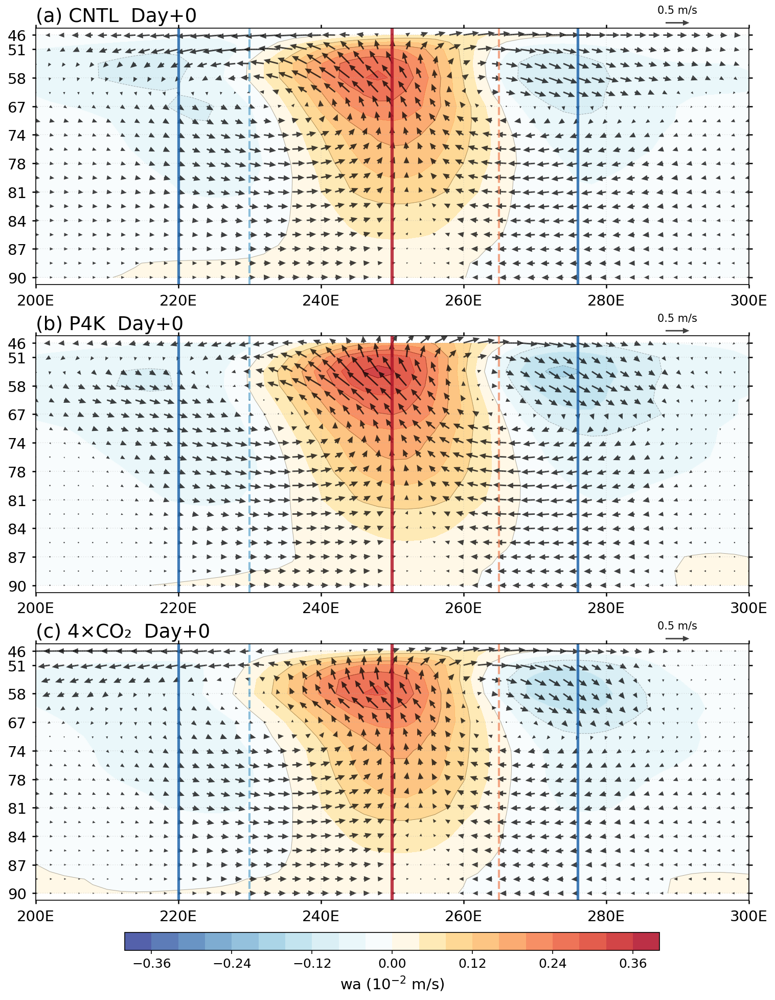

In [27]:
def plot_lon_level_section_with_arrows(
        wa_composites, ua_composites,
        experiments=['CNTL', 'P4K', '4CO2'],
        lag=0, lat_range=(-5, 5), lon_range=(100, 200),
        arrow_density=5, figsize=(18, 12),
        wind_scale=50, arrow_width=0.002,
        manual_lons=None,
        center_lon=None, left_lon=None, right_lon=None,
        use_common_center=True):
    """
    绘制经度-高度剖面图，带有风场箭头和异常中心标记
    
    参数:
    --------
    manual_lons : list or None
        手动指定任意数量的经度位置
        如果指定，则会覆盖其他位置参数
        示例: [222, 230, 250, 265, 276] 或 [230, 250, 270] 或任意数量
    center_lon : float, optional
        手动指定正异常中心经度（当 manual_lons 为 None 时使用）
    left_lon : float, optional
        手动指定左侧负异常中心经度（当 manual_lons 为 None 时使用）
    right_lon : float, optional
        手动指定右侧负异常中心经度（当 manual_lons 为 None 时使用）
    use_common_center : bool, default=True
        如果为True，则使用所有实验的平均值计算统一的异常中心
    """
    
    # 导入必要的库（放在函数开头）
    from matplotlib.colors import LinearSegmentedColormap
    titles =['(a) CNTL', '(b) P4K', '(c) 4×CO₂']
    fig, axes = plt.subplots(len(experiments), 1, figsize=figsize, dpi=150)
    if len(experiments) == 1:
        axes = [axes]
    
    # 初始化过渡区经度（默认值）
    transition_1 = 230  # 130°W
    transition_2 = 265  # 95°W
    lon_positions = []  # 存储所有位置
    
    # 如果使用 manual_lons，则从列表中提取所有位置
    if manual_lons is not None:
        n_lons = len(manual_lons)
        if n_lons < 1:
            print(f"❌ manual_lons 至少需要包含1个经度值")
            return None
        
        print(f"📍 使用手动指定的 {n_lons} 个经度位置:")
        lon_positions = manual_lons
        
        # 生成标签
        if n_lons == 1:
            labels_list = ['0']
        elif n_lons % 2 == 1:  # 奇数
            center_idx = n_lons // 2
            labels_list = [str(i - center_idx) for i in range(n_lons)]
        else:  # 偶数
            labels_list = [str(i - n_lons // 2 + 0.5) for i in range(n_lons)]
        
        for idx, lon in enumerate(manual_lons):
            print(f"  ✅ 位置 {labels_list[idx]}: {lon:.1f}°E")
    # 如果没有手动指定中心位置且use_common_center=True，则计算所有实验的平均异常中心
    elif use_common_center and (center_lon is None or left_lon is None or right_lon is None):
        print("🔄 自动计算所有实验的统一异常中心位置...")
        all_vertical_means = []
        
        for exp in experiments:
            wa_da = wa_composites[exp]
            if 'level' in wa_da.dims:
                wa_level_dim = 'level'
            elif 'lev' in wa_da.dims:
                wa_level_dim = 'lev'
            else:
                raise KeyError(f"Vertical dimension not found in wa_da.dims={wa_da.dims}")
            
            wa_data = (
                wa_da
                .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
                .sel({wa_level_dim: slice(46, 90)})
                .mean(dim='lat')
            )
            wa_plot = wa_data * 100  # Pa/s → mm/s
            vertical_mean = np.nanmean(wa_plot.values, axis=0)
            all_vertical_means.append(vertical_mean)
        
        # 计算所有实验的平均垂直廓线
        common_vertical_mean = np.nanmean(all_vertical_means, axis=0)
        lon_vals = wa_data.lon.values
        
        # 计算统一的中心位置
        if center_lon is None and len(common_vertical_mean) > 0:
            center_lon_idx = np.nanargmax(common_vertical_mean)
            center_lon = lon_vals[center_lon_idx]
            print(f"  正异常中心: {center_lon:.1f}°E")
        
        if left_lon is None and center_lon is not None:
            center_lon_idx = np.argmin(np.abs(lon_vals - center_lon))
            if center_lon_idx > 10:
                left_mean = common_vertical_mean[:center_lon_idx-5]
                if len(left_mean) > 0 and np.any(left_mean < 0):
                    left_min_idx = np.nanargmin(left_mean)
                    left_lon = lon_vals[left_min_idx]
                    print(f"  左侧负异常: {left_lon:.1f}°E")
        
        if right_lon is None and center_lon is not None:
            center_lon_idx = np.argmin(np.abs(lon_vals - center_lon))
            if center_lon_idx < len(common_vertical_mean) - 10:
                right_mean = common_vertical_mean[center_lon_idx+5:]
                if len(right_mean) > 0 and np.any(right_mean < 0):
                    right_min_idx = np.nanargmin(right_mean) + center_lon_idx + 5
                    right_lon = lon_vals[right_min_idx]
                    print(f"  右侧负异常: {right_lon:.1f}°E")

    for i, exp in enumerate(experiments):
        ax = axes[i]

        # wa_composites[exp] 和 ua_composites[exp] 都是 DataArray
        wa_da = wa_composites[exp]
        ua_da = ua_composites[exp]

        # 自动识别垂直维度名（分别检测wa和ua的维度）
        if 'level' in wa_da.dims:
            wa_level_dim = 'level'
        elif 'lev' in wa_da.dims:
            wa_level_dim = 'lev'
        else:
            raise KeyError(
                f"Vertical dimension not found in wa_da.dims={wa_da.dims}, expected 'level' or 'lev'"
            )
        
        if 'level' in ua_da.dims:
            ua_level_dim = 'level'
        elif 'lev' in ua_da.dims:
            ua_level_dim = 'lev'
        else:
            raise KeyError(
                f"Vertical dimension not found in ua_da.dims={ua_da.dims}, expected 'level' or 'lev'"
            )

        # 数据选择：lag, lat, lon, 以及层裁剪 46–90
        wa_data = (
            wa_da
            .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
            .sel({wa_level_dim: slice(46, 90)})
            .mean(dim='lat')
        )

        ua_data = (
            ua_da
            .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
            .sel({ua_level_dim: slice(46, 90)})
            .mean(dim='lat')
        )

        # 单位处理
        wa_plot = wa_data * 100     # Pa/s → mm/s

        ax.tick_params(    which='both',direction='out',
               width=1.2,
                    pad=5, 
                    labelsize=14,
                    bottom=True, left=True, right=True, top=True)
        # 坐标准备（使用wa的维度名）
        lon_vals = wa_data.lon.values
        level_vals = wa_data[wa_level_dim].values
        level_idx = np.arange(len(level_vals))
        LON, LEV = np.meshgrid(lon_vals, level_idx)

        # colormap & contour
        colors_list = [
            '#313695', '#4575b4', '#74add1', '#abd9e9', '#e0f3f8',
            'white',
            '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026'
        ]
        cmap = LinearSegmentedColormap.from_list('wa_cmap', colors_list)

        levels = np.linspace(-0.4, 0.4, 21)

        cf = ax.contourf(LON, LEV, wa_plot.values, levels, cmap=cmap, alpha=0.85)
        ax.contour(LON, LEV, wa_plot.values, levels[::2], colors='k', alpha=0.3, linewidths=0.5)
      
        # 风场箭头
        LON_q = LON[::arrow_density, ::arrow_density]
        LEV_q = LEV[::arrow_density, ::arrow_density]
        UA_q = ua_data.values[::arrow_density, ::arrow_density]
        WA_q = wa_plot.values[::arrow_density, ::arrow_density]

        Q = ax.quiver(
            LON_q, LEV_q,
            UA_q, WA_q,
            scale=wind_scale,
            width=arrow_width,
            headwidth=4, headlength=4.5,
            color='k', alpha=0.75
        )

        ax.quiverkey(Q, 0.9, 1.02, 0.5, "0.5 m/s", coordinates='axes')

        # y 轴: 改为 hPa
        ax.set_ylim(-0.5, len(level_vals) - 0.5)
        ax.invert_yaxis()
        yticks = np.linspace(0, len(level_vals)-1, 10, dtype=int)
        ax.set_yticks(yticks)
        ax.set_yticklabels([f"{int(level_vals[j])}" for j in yticks])
        from cartopy.mpl.ticker import LongitudeFormatter
        # ax.xaxis.set_major_formatter(LongitudeFormatter())
        def east_longitude_formatter(x, pos):
            # x 是刻度值（0–360 都保持）
            val = x % 360
            return f"{int(val)}E"

        # ax = plt.gca()  # 或你的 ax
        ax.xaxis.set_major_formatter(east_longitude_formatter)
        
        ax.set_title(f"{titles[i]}  Day{lag:+d}", loc='left',fontsize=18)
        ax.grid(True, linestyle=':', alpha=0.3)
        
        # 绘制统一的垂直参考线（所有实验使用相同位置）
        # 支持任意数量的垂直线
        if len(lon_positions) > 0:
            n_lines = len(lon_positions)
            
            # 自动生成颜色方案
            if n_lines <= 3:
                vline_colors = ['#0099ff', '#b2182b', '#07c4f3'][:n_lines]
            elif n_lines <= 5:
                vline_colors = ['#2166ac', '#67a9cf', '#b2182b', '#ef8a62', '#2166ac'][:n_lines]
            else:
                import matplotlib.cm as cm
                cmap = cm.get_cmap('tab20')
                vline_colors = [cmap(i/n_lines) for i in range(n_lines)]
            
            # 自动生成线型（实线、虚线交替）
            vline_styles = ['-', '--'] * (n_lines // 2 + 1)
            vline_styles = vline_styles[:n_lines]
            
            # 绘制所有垂直线
            for idx, lon_pos in enumerate(lon_positions):
                # 判断是否为中心位置
                is_center = (n_lines % 2 == 1) and (idx == n_lines // 2)
                linewidth = 3.0 if is_center else 2.5
                
                ax.axvline(x=lon_pos, color=vline_colors[idx], 
                          linestyle=vline_styles[idx], 
                          linewidth=linewidth, alpha=0.85)
        else:
            # 旧的默认行为（自动计算模式）
            if left_lon is not None:
                ax.axvline(x=left_lon, color='#2166ac', linestyle='-', linewidth=2.5, alpha=0.85)
            ax.axvline(x=transition_1, color='#67a9cf', linestyle='--', linewidth=2.0, alpha=0.75)
            if center_lon is not None:
                ax.axvline(x=center_lon, color='#b2182b', linestyle='-', linewidth=3.0, alpha=0.85)
            ax.axvline(x=transition_2, color='#ef8a62', linestyle='--', linewidth=2.0, alpha=0.75)
            if right_lon is not None:
                ax.axvline(x=right_lon, color='#2166ac', linestyle='-', linewidth=2.5, alpha=0.85)
        
        if i == len(experiments)-1:
            cbar = plt.colorbar(cf, ax=axes, orientation='horizontal', pad=0.03, aspect=30,shrink=0.75)
            cbar.set_label(r"wa ($10^{-2}$ m/s)", fontsize=14)
            cbar.ax.tick_params(labelsize=12)
    
    # 在所有子图绘制完成后，在图的底部添加统一的图例
    from matplotlib.lines import Line2D
    
    if len(lon_positions) > 0:
        # 手动指定模式：根据位置数量生成图例
        n_lines = len(lon_positions)
        
        # 生成标签
        if manual_lons is not None:
            if n_lines == 1:
                line_labels = ['0']
            elif n_lines % 2 == 1:  # 奇数
                center_idx = n_lines // 2
                line_labels = [str(i - center_idx) for i in range(n_lines)]
            else:  # 偶数
                line_labels = [str(i - n_lines // 2 + 0.5) for i in range(n_lines)]
        
        # 生成颜色和线型
        if n_lines <= 3:
            vline_colors = ['#0099ff', '#b2182b', '#07c4f3'][:n_lines]
        elif n_lines <= 5:
            vline_colors = ['#2166ac', '#67a9cf', '#b2182b', '#ef8a62', '#2166ac'][:n_lines]
        else:
            import matplotlib.cm as cm
            cmap = cm.get_cmap('tab20')
            vline_colors = [cmap(i/n_lines) for i in range(n_lines)]
        
        vline_styles = ['-', '--'] * (n_lines // 2 + 1)
        vline_styles = vline_styles[:n_lines]
        
        legend_elements = []
        for idx in range(n_lines):
            is_center = (n_lines % 2 == 1) and (idx == n_lines // 2)
            linewidth = 3.0 if is_center else 2.5
            
            legend_elements.append(
                Line2D([0], [0], color=vline_colors[idx], 
                      linestyle=vline_styles[idx], 
                      linewidth=linewidth,
                      label=f'{line_labels[idx]}: {lon_positions[idx]:.1f}°E')
            )
    else:
        # 自动计算模式：使用默认图例
        legend_elements = [
            Line2D([0], [0], color='#2166ac', linestyle='-', linewidth=2.5, 
                   label=f'-2: {left_lon:.1f}°E' if left_lon else '-2'),
            Line2D([0], [0], color='#67a9cf', linestyle='--', linewidth=2.0, 
                   label=f'-1: {transition_1:.1f}°E'),
            Line2D([0], [0], color='#b2182b', linestyle='-', linewidth=3.0, 
                   label=f'0: {center_lon:.1f}°E' if center_lon else '0'),
            Line2D([0], [0], color='#ef8a62', linestyle='--', linewidth=2.0, 
                   label=f'+1: {transition_2:.1f}°E'),
            Line2D([0], [0], color='#2166ac', linestyle='-', linewidth=2.5, 
                   label=f'+2: {right_lon:.1f}°E' if right_lon else '+2')
        ]
    
    # 根据图例数量自动调整列数
    ncol = min(len(legend_elements), 5)
   
  
    out = "./figures/kelvin_lon_level_section.png"
    plt.savefig(out, dpi=300, bbox_inches='tight')
    print("Saved to:", out)
    return fig

# 使用统一的异常中心（自动计算所有实验的平均位置）
fig = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    lag=0,
    lat_range=(5, 15),
    lon_range=(200, 300),
    arrow_density=1,
    figsize=(12, 18),
    wind_scale=15,
    use_common_center=True,  # 使用所有实验的统一中心
    # center_lon=250.0,  # 可选：手动指定正异常中心经度
    # left_lon=230.0,    # 可选：手动指定左侧负异常经度
    # right_lon=270.0,   # 可选：手动指定右侧负异常经度
)
plt.show()


## 手动指定绘制的位置

📍 使用手动指定的 5 个经度位置:
  ✅ 位置 -2: 225.0°E
  ✅ 位置 -1: 233.5°E
  ✅ 位置 0: 246.0°E
  ✅ 位置 1: 260.0°E
  ✅ 位置 2: 265.0°E


Saved to: ./figures/kelvin_lon_level_section.png


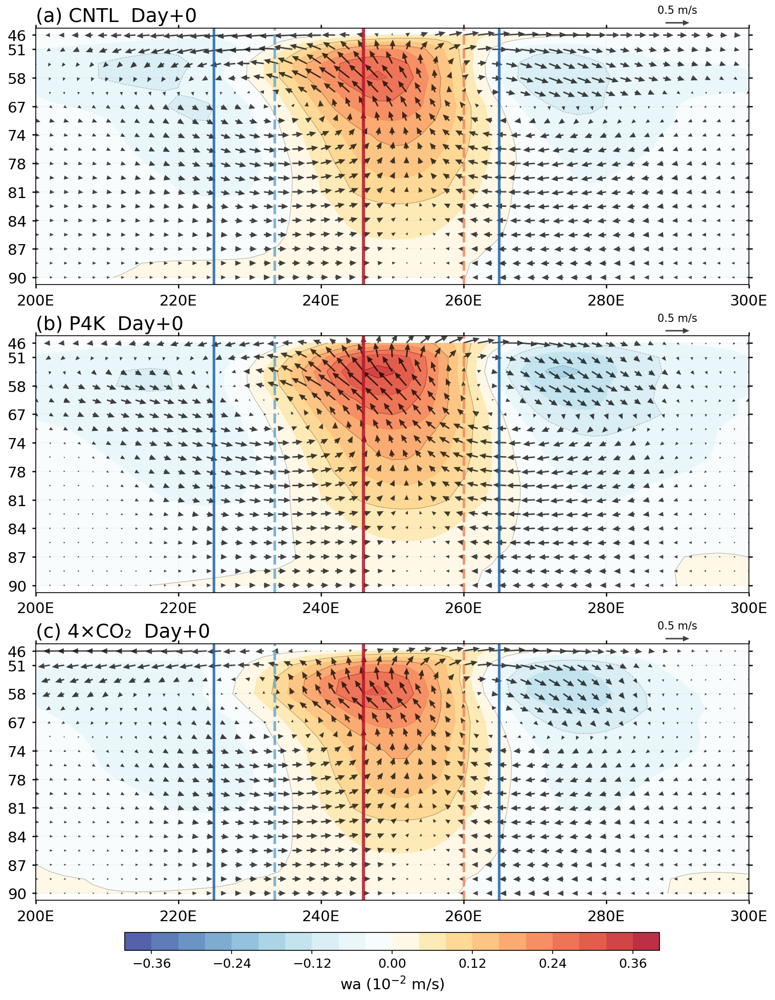

In [28]:
# 测试手动指定5个经度位置（与垂直剖面图保持一致）
fig_manual = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    lag=0,
    lat_range=(5, 15),
    lon_range=(200, 300),
    arrow_density=1,
    figsize=(12, 18),
    wind_scale=15,
    manual_lons= [ 225, 233.5, 246, 260,265]  
)
plt.show()

### 改进说明：统一的异常中心位置

**主要改进：**

1. **统一的异常中心计算**：默认情况下（`use_common_center=True`），函数会先计算所有实验的平均垂直廓线，然后基于这个平均廓线确定统一的异常中心位置，确保三个实验使用相同的参考线。

2. **支持手动指定中心位置**：可以通过以下参数手动指定异常中心的经度位置：
   - `center_lon`：正异常中心经度
   - `left_lon`：左侧负异常中心经度
   - `right_lon`：右侧负异常中心经度

3. **方便实验对比**：由于三个实验使用相同的垂直参考线，可以更容易地比较它们之间的差异。

**使用方法：**

```python
# 方法1：自动计算统一中心（推荐）
fig = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    use_common_center=True  # 使用所有实验的统一中心
)

# 方法2：手动指定中心位置
fig = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    center_lon=250.0,  # 手动指定正异常中心
    left_lon=230.0,    # 手动指定左侧负异常
    right_lon=270.0    # 手动指定右侧负异常
)

# 方法3：部分手动指定（其余自动计算）
fig = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    use_common_center=True,
    center_lon=250.0,  # 只指定正异常中心，其余自动计算
)
```


计算所有实验的统一异常中心位置...
  正异常中心: 250.0°E
  左侧负异常: 220.0°E
  右侧负异常: 276.0°E


Saved to: ./figures/kelvin_lon_level_section.png


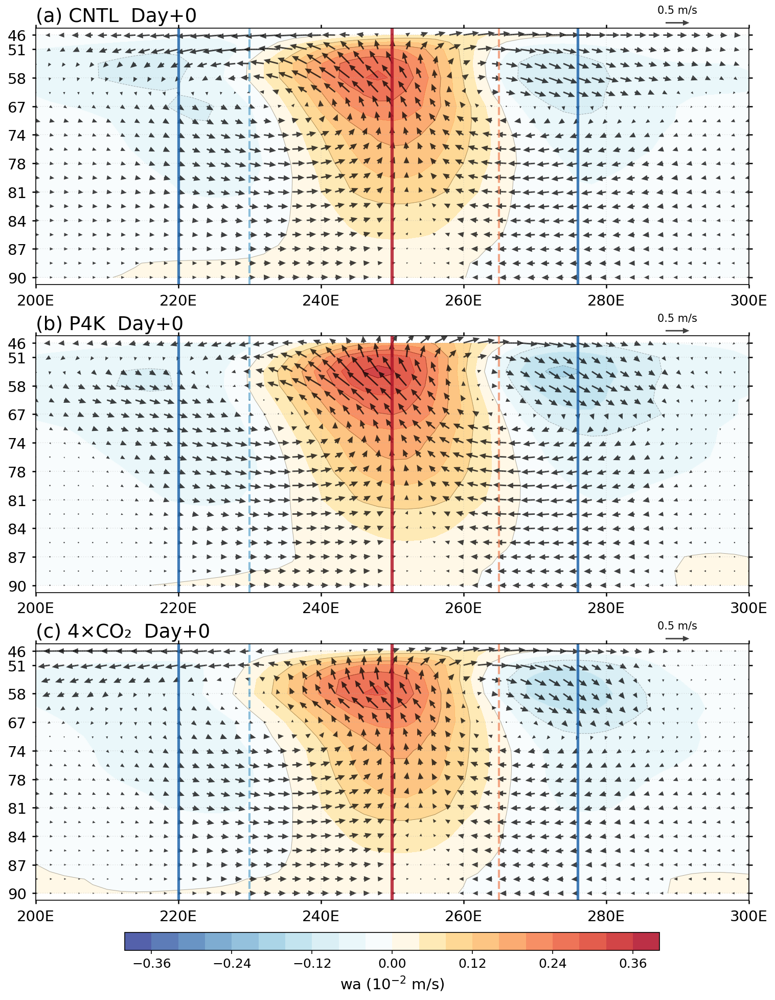

In [29]:
def plot_lon_level_section_with_arrows(
        wa_composites, ua_composites,
        experiments=['CNTL', 'P4K', '4CO2'],
        lag=0, lat_range=(-5, 5), lon_range=(100, 200),
        arrow_density=5, figsize=(18, 12),
        wind_scale=50, arrow_width=0.002,
        center_lon=None, left_lon=None, right_lon=None,
        use_common_center=True):
    """
    绘制经度-高度剖面图，带有风场箭头和异常中心标记
    
    参数:
    --------
    center_lon : float, optional
        手动指定正异常中心经度。如果为None，则自动计算
    left_lon : float, optional
        手动指定左侧负异常中心经度。如果为None，则自动计算
    right_lon : float, optional
        手动指定右侧负异常中心经度。如果为None，则自动计算
    use_common_center : bool, default=True
        如果为True，则使用所有实验的平均值计算统一的异常中心
        如果为False，则每个实验单独计算（不推荐，不利于对比）
    """
    
    # 导入必要的库（放在函数开头）
    from matplotlib.colors import LinearSegmentedColormap
    titles =['(a) CNTL', '(b) P4K', '(c) 4×CO₂']
    fig, axes = plt.subplots(len(experiments), 1, figsize=figsize, dpi=150)
    if len(experiments) == 1:
        axes = [axes]
    
    # 如果没有手动指定中心位置且use_common_center=True，则计算所有实验的平均异常中心
    if use_common_center and (center_lon is None or left_lon is None or right_lon is None):
        print("计算所有实验的统一异常中心位置...")
        all_vertical_means = []
        
        for exp in experiments:
            wa_da = wa_composites[exp]
            if 'level' in wa_da.dims:
                wa_level_dim = 'level'
            elif 'lev' in wa_da.dims:
                wa_level_dim = 'lev'
            else:
                raise KeyError(f"Vertical dimension not found in wa_da.dims={wa_da.dims}")
            
            wa_data = (
                wa_da
                .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
                .sel({wa_level_dim: slice(46, 90)})
                .mean(dim='lat')
            )
            wa_plot = wa_data * 100  # Pa/s → mm/s
            vertical_mean = np.nanmean(wa_plot.values, axis=0)
            all_vertical_means.append(vertical_mean)
        
        # 计算所有实验的平均垂直廓线
        common_vertical_mean = np.nanmean(all_vertical_means, axis=0)
        lon_vals = wa_data.lon.values
        
        # 计算统一的中心位置
        if center_lon is None and len(common_vertical_mean) > 0:
            center_lon_idx = np.nanargmax(common_vertical_mean)
            center_lon = lon_vals[center_lon_idx]
            print(f"  正异常中心: {center_lon:.1f}°E")
        
        if left_lon is None and center_lon is not None:
            center_lon_idx = np.argmin(np.abs(lon_vals - center_lon))
            if center_lon_idx > 10:
                left_mean = common_vertical_mean[:center_lon_idx-5]
                if len(left_mean) > 0 and np.any(left_mean < 0):
                    left_min_idx = np.nanargmin(left_mean)
                    left_lon = lon_vals[left_min_idx]
                    print(f"  左侧负异常: {left_lon:.1f}°E")
        
        if right_lon is None and center_lon is not None:
            center_lon_idx = np.argmin(np.abs(lon_vals - center_lon))
            if center_lon_idx < len(common_vertical_mean) - 10:
                right_mean = common_vertical_mean[center_lon_idx+5:]
                if len(right_mean) > 0 and np.any(right_mean < 0):
                    right_min_idx = np.nanargmin(right_mean) + center_lon_idx + 5
                    right_lon = lon_vals[right_min_idx]
                    print(f"  右侧负异常: {right_lon:.1f}°E")

    for i, exp in enumerate(experiments):
        ax = axes[i]

        # wa_composites[exp] 和 ua_composites[exp] 都是 DataArray
        wa_da = wa_composites[exp]
        ua_da = ua_composites[exp]

        # 自动识别垂直维度名（分别检测wa和ua的维度）
        if 'level' in wa_da.dims:
            wa_level_dim = 'level'
        elif 'lev' in wa_da.dims:
            wa_level_dim = 'lev'
        else:
            raise KeyError(
                f"Vertical dimension not found in wa_da.dims={wa_da.dims}, expected 'level' or 'lev'"
            )
        
        if 'level' in ua_da.dims:
            ua_level_dim = 'level'
        elif 'lev' in ua_da.dims:
            ua_level_dim = 'lev'
        else:
            raise KeyError(
                f"Vertical dimension not found in ua_da.dims={ua_da.dims}, expected 'level' or 'lev'"
            )

        # 数据选择：lag, lat, lon, 以及层裁剪 46–90
        wa_data = (
            wa_da
            .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
            .sel({wa_level_dim: slice(46, 90)})
            .mean(dim='lat')
        )

        ua_data = (
            ua_da
            .sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range))
            .sel({ua_level_dim: slice(46, 90)})
            .mean(dim='lat')
        )

        # 单位处理
        wa_plot = wa_data * 100     # Pa/s → mm/s


        # 坐标准备（使用wa的维度名）
        lon_vals = wa_data.lon.values
        level_vals = wa_data[wa_level_dim].values
        level_idx = np.arange(len(level_vals))
        LON, LEV = np.meshgrid(lon_vals, level_idx)

        # colormap & contour
        colors_list = [
            '#313695', '#4575b4', '#74add1', '#abd9e9', '#e0f3f8',
            'white',
            '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026'
        ]
        cmap = LinearSegmentedColormap.from_list('wa_cmap', colors_list)

        levels = np.linspace(-0.4, 0.4, 21)

        cf = ax.contourf(LON, LEV, wa_plot.values, levels, cmap=cmap, alpha=0.85)
        ax.contour(LON, LEV, wa_plot.values, levels[::2], colors='k', alpha=0.3, linewidths=0.5)
      
        # 风场箭头
        LON_q = LON[::arrow_density, ::arrow_density]
        LEV_q = LEV[::arrow_density, ::arrow_density]
        UA_q = ua_data.values[::arrow_density, ::arrow_density]
        WA_q = wa_plot.values[::arrow_density, ::arrow_density]

        Q = ax.quiver(
            LON_q, LEV_q,
            UA_q, WA_q,
            scale=wind_scale,
            width=arrow_width,
            headwidth=4, headlength=4.5,
            color='k', alpha=0.75
        )

        ax.quiverkey(Q, 0.9, 1.02, 0.5, "0.5 m/s", coordinates='axes')

        # y 轴: 改为 hPa
        ax.set_ylim(-0.5, len(level_vals) - 0.5)
        
        ax.invert_yaxis()
        
        yticks = np.linspace(0, len(level_vals)-1, 10, dtype=int)
        ax.set_yticks(yticks)
        ax.set_yticklabels([f"{int(level_vals[j])}" for j in yticks])
        from cartopy.mpl.ticker import LongitudeFormatter
        # ax.xaxis.set_major_formatter(LongitudeFormatter())
        def east_longitude_formatter(x, pos):
            # x 是刻度值（0–360 都保持）
            val = x % 360
            return f"{int(val)}E"

        # ax = plt.gca()  # 或你的 ax
        ax.xaxis.set_major_formatter(east_longitude_formatter)
        
        ax.set_title(f"{titles[i]}  Day{lag:+d}", loc='left', fontsize=18)
        ax.grid(True, linestyle=':', alpha=0.3)
        
        ax.tick_params(which='both', direction='out',
                      width=1.2, pad=5, labelsize=14,
                      bottom=True, left=True, right=True, top=True)
        
        # 绘制统一的垂直参考线（所有实验使用相同位置）
        # 使用专业的配色方案：蓝色系表示负异常，红色系表示正异常，青色系表示过渡区
        # 不在循环中添加label，避免重复
        
        # 左侧负异常：深蓝色实线
        if left_lon is not None:
            ax.axvline(x=left_lon, color='#2166ac', linestyle='-', linewidth=2.5, alpha=0.85)
        
        # 过渡区1 (230E/130°W)：青色虚线
        ax.axvline(x=230, color='#67a9cf', linestyle='--', linewidth=2.0, alpha=0.75)
        
        # 正异常中心：深红色实线（最醒目）
        if center_lon is not None:
            ax.axvline(x=center_lon, color='#b2182b', linestyle='-', linewidth=3.0, alpha=0.85)
        
        # 过渡区2 (265E/95°W)：橙色虚线
        ax.axvline(x=265, color='#ef8a62', linestyle='--', linewidth=2.0, alpha=0.75)
        
        # 右侧负异常：深蓝色实线
        if right_lon is not None:
            ax.axvline(x=right_lon, color='#2166ac', linestyle='-', linewidth=2.5, alpha=0.85)
        
        if i == len(experiments)-1:
            cbar = plt.colorbar(cf, ax=axes, orientation='horizontal', pad=0.03, aspect=30,shrink=0.75)
            cbar.set_label(r"wa ($10^{-2}$ m/s)", fontsize=14)
            cbar.ax.tick_params(labelsize=12)
    
    # 在所有子图绘制完成后，在图的底部添加统一的图例
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='#2166ac', linestyle='-', linewidth=2.5, 
               label=f'Negative anomaly ({left_lon:.1f}°E, {right_lon:.1f}°E)'),
        Line2D([0], [0], color='#67a9cf', linestyle='--', linewidth=2.0, 
               label='Transition zone (230°E/130°W)'),
        Line2D([0], [0], color='#b2182b', linestyle='-', linewidth=3.0, 
               label=f'Positive center ({center_lon:.1f}°E)'),
        Line2D([0], [0], color='#ef8a62', linestyle='--', linewidth=2.0, 
               label='Transition zone (265°E/95°W)')
    ]
    
    # 将图例放在图的底部中央
    # fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.3, -0.02),
    #           ncol=2, fontsize=11, frameon=True, framealpha=0.95)

    out = "./figures/kelvin_lon_level_section.png"
    plt.savefig(out, dpi=300, bbox_inches='tight')
    print("Saved to:", out)
    return fig

# 使用统一的异常中心（自动计算所有实验的平均位置）
fig = plot_lon_level_section_with_arrows(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    lag=0,
    lat_range=(5, 15),
    lon_range=(200, 300),
    arrow_density=1,
    figsize=(12, 18),
    wind_scale=15,
    use_common_center=True,  # 使用所有实验的统一中心
    # center_lon=250.0,  # 可选：手动指定正异常中心经度
    # left_lon=230.0,    # 可选：手动指定左侧负异常经度
    # right_lon=270.0,   # 可选：手动指定右侧负异常经度
)
plt.show()



🎨 Plotting vertical profiles comparison...

📊 Processing Day +0...
   📌 对比正异常中心和两侧负异常的垂直结构
   📌 垂直层范围: 46-90

🔍 确定统一的经度位置...
  📍 使用手动指定的 5 个经度位置:
  ✅ 位置 -2: 225.0°E
  ✅ 位置 -1: 234.0°E
  ✅ 位置 0: 240.0°E
  ✅ 位置 1: 260.0°E
  ✅ 位置 2: 270.0°E



💾 Figure saved: ./figures/pr_regression_composite/vertical_profiles_fixed_lons_day+0.png


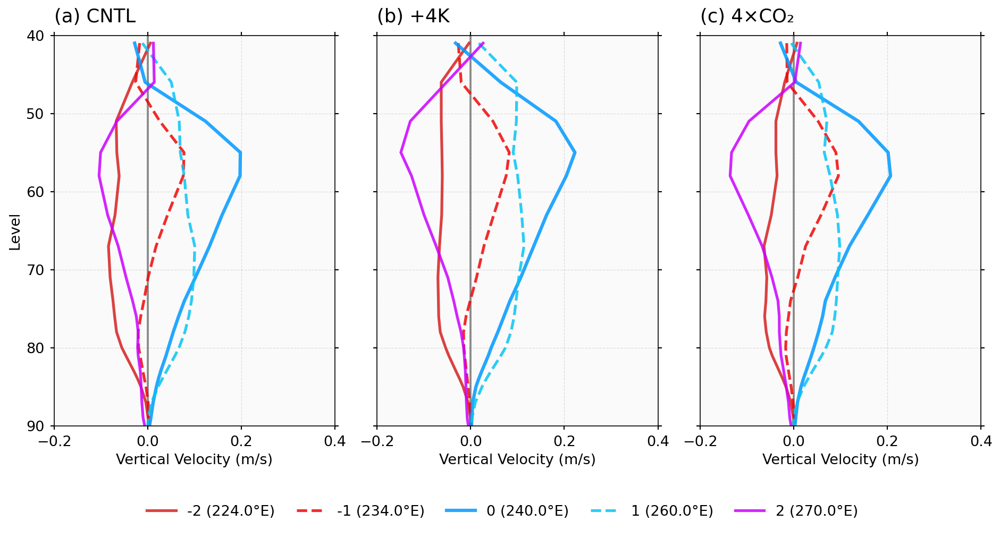


✅ Vertical profiles comparison complete!


In [30]:
def plot_vertical_profiles_comparison(wa_composites, ua_composites, experiments=['CNTL', 'P4K', '4CO2'],
                                     lag=0, lat_range=(-5, 5), lon_range=(100, 200),
                                     level_range=(46, 90), figsize=(15, 10),
                                     manual_lons=None):
    """
    绘制选定经度位置的垂直剖面对比图（使用相同的经度位置）
    
    Parameters:
    -----------
    wa_composites : dict
        垂直速度合成数据
    ua_composites : dict
        纬向风合成数据
    experiments : list
        实验名称列表
    lag : int
        滞后天数
    lat_range : tuple
        纬度范围用于平均
    lon_range : tuple
        经度范围
    level_range : tuple
        垂直层范围 (最低层, 最高层)
    manual_lons : list or None
        手动指定任意数量的经度位置
        如果为None，则自动计算经度位置（默认5个位置）
        示例: [222, 230, 250, 265, 276] 或 [230, 250, 270] 或任意数量
    """
    # 首先，使用第一个实验（通常是CNTL）来确定统一的经度位置
    print("\n🔍 确定统一的经度位置...")
    
    first_exp = experiments[0]
    if first_exp not in wa_composites:
        print(f"❌ {first_exp} 数据不可用")
        return None, None
    
    wa_comp = wa_composites[first_exp]
    
    # 检查level维度
    if 'level' in wa_comp.dims:
        level_dim = 'level'
    elif 'lev' in wa_comp.dims:
        level_dim = 'lev'
    else:
        print("❌ 找不到level维度")
        return None, None
    
    # 获取数据用于确定位置
    wa_data = wa_comp.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
    wa_plot = wa_data * 100  # Pa/s 转 mm/s
    
    level_vals = wa_data[level_dim].values
    lon_vals = wa_data.lon.values
    
    # 限制到指定层范围
    level_mask = (level_vals >= level_range[0]) & (level_vals <= level_range[1])
    level_subset = level_vals[level_mask]
    wa_subset = wa_plot.values[level_mask, :]
    
    # 计算垂直平均找到正负异常中心
    vertical_mean = np.nanmean(wa_subset, axis=0)
    
    # 找到正异常中心
    center_lon_idx = np.nanargmax(vertical_mean)
    center_lon = lon_vals[center_lon_idx]
    
    # 找到左侧负异常
    left_mean = vertical_mean[:max(0, center_lon_idx-5)]
    if len(left_mean) > 0 and np.any(left_mean < 0):
        left_min_idx = np.nanargmin(left_mean)
        left_lon = lon_vals[left_min_idx]
    else:
        left_lon = lon_vals[0]
    
    # 找到右侧负异常
    right_mean = vertical_mean[min(len(vertical_mean)-1, center_lon_idx+5):]
    if len(right_mean) > 0 and np.any(right_mean < 0):
        right_min_idx = np.nanargmin(right_mean) + center_lon_idx + 5
        right_lon = lon_vals[min(right_min_idx, len(lon_vals)-1)]
    else:
        right_lon = lon_vals[-1]
    
    # 如果手动指定了经度位置，则使用手动值；否则自动计算
    if manual_lons is not None:
        n_lons = len(manual_lons)
        if n_lons < 1:
            print(f"❌ manual_lons 至少需要包含1个经度值")
            return None, None
        
        print(f"  📍 使用手动指定的 {n_lons} 个经度位置:")
        unified_lons = {}
        
        # 根据数量生成标签
        if n_lons == 1:
            labels_list = ['0']
        elif n_lons % 2 == 1:  # 奇数个位置
            center_idx = n_lons // 2
            labels_list = [str(i - center_idx) for i in range(n_lons)]
        else:  # 偶数个位置
            labels_list = [str(i - n_lons // 2 + 0.5) for i in range(n_lons)]
        
        for idx, lon in enumerate(manual_lons):
            key = f'position_{idx}'
            unified_lons[key] = lon
            print(f"  ✅ 位置 {labels_list[idx]}: {lon:.1f}°E")
    else:
        # 自动计算经度位置（原有逻辑）
        print("  🔄 自动计算经度位置:")
        # 计算过渡区经度（130W = 230E, 95W = 265E）
        transition_1 = 230  # 130°W
        transition_2 = 265  # 95°W
        
        # 统一的经度位置列表
        unified_lons = {
            'negative_left': left_lon,
            'transition_1': transition_1,
            'positive_center': center_lon,
            'transition_2': transition_2,
            'negative_right': right_lon
        }
        
        print(f"  ✅ 左侧负异常: {left_lon:.1f}°E")
        print(f"  ✅ 过渡区1 (130°W): {transition_1:.1f}°E")
        print(f"  ✅ 正异常中心: {center_lon:.1f}°E")
        print(f"  ✅ 过渡区2 (95°W): {transition_2:.1f}°E")
        print(f"  ✅ 右侧负异常: {right_lon:.1f}°E")
    
    # 创建图形
    n_exp = len(experiments)
    fig, axes = plt.subplots(1, n_exp, figsize=figsize, dpi=150, sharey=True)
    
    if n_exp == 1:
        axes = [axes]
    
    exp_titles = {'CNTL': 'CNTL', 'P4K': '+4K', '4CO2': r'4×CO₂'}
    
    # 为每个实验绘制相同位置的剖面
    for i, exp in enumerate(experiments):
        ax = axes[i]
        
        
        if exp not in wa_composites:
            continue
        
        wa_comp = wa_composites[exp]
        
        # 检查level维度
        if 'level' in wa_comp.dims:
            level_dim = 'level'
        elif 'lev' in wa_comp.dims:
            level_dim = 'lev'
        else:
            continue
        
        # 选择数据
        wa_data = wa_comp.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
        wa_plot = wa_data * 100  # Pa/s 转 mm/s
        
        level_vals = wa_data[level_dim].values
        lon_vals = wa_data.lon.values
        
        # 限制到指定层范围
        level_mask = (level_vals >= level_range[0]) & (level_vals <= level_range[1])
        level_subset = level_vals[level_mask]
        wa_subset = wa_plot.values[level_mask, :]
        
        # 绘制剖面线（使用统一的经度位置）- 支持任意数量
        n_profiles = len(unified_lons)
        
        # 自动生成颜色方案（使用色谱）
        if n_profiles <= 3:
            # 少量线条：使用固定的明显颜色
            colors = ['#0099ff', '#d62121', '#07c4f3'][:n_profiles]
        elif n_profiles <= 5:
            # 中等数量：使用固定配色
            colors = ["#d62121", "#f10606", "#0099ff", "#07c4f3", "#cc00ff"][:n_profiles]
        else:
            # 大量线条：使用色谱自动生成
            import matplotlib.cm as cm
            cmap = cm.get_cmap('tab20')
            colors = [cmap(i/n_profiles) for i in range(n_profiles)]
        
        # 自动生成线型（实线、虚线交替）
        linestyles = ['-', '--'] * (n_profiles // 2 + 1)
        linestyles = linestyles[:n_profiles]
        
        # 自动生成标记
        markers = ['o', 's', '^', 'v', 'd', 'p', '*', 'h']
        markers = (markers * (n_profiles // len(markers) + 1))[:n_profiles]
        
        # 生成标签
        if manual_lons is not None:
            if n_profiles == 1:
                profile_labels = ['0']
            elif n_profiles % 2 == 1:  # 奇数
                center_idx = n_profiles // 2
                profile_labels = [str(i - center_idx) for i in range(n_profiles)]
            else:  # 偶数
                profile_labels = [str(i - n_profiles // 2 + 0.5) for i in range(n_profiles)]
        else:
            # 自动计算模式，使用描述性标签
            profile_labels = ['Left-', 'Trans-', 'Center', 'Trans+', 'Right+'][:n_profiles]
        
        for j, (key, target_lon) in enumerate(unified_lons.items()):
            # 找到最接近的经度索引
            lon_idx = np.argmin(np.abs(lon_vals - target_lon))
            actual_lon = lon_vals[lon_idx]
            profile = wa_subset[:, lon_idx]
            
            # 判断是否为中心位置（用于线宽调整）
            is_center = (n_profiles % 2 == 1) and (j == n_profiles // 2)
            
            ax.plot(profile, level_subset, 
                   color=colors[j], 
                   linestyle=linestyles[j],
                   linewidth=3.0 if is_center else 2.5,
                   label=f'{profile_labels[j]} ({actual_lon:.1f}°E)', 
                #    marker=markers[j], 
                   markersize=7 if is_center else 5,
                   alpha=0.85,
                   markevery=4,
                   markeredgewidth=1.,
                   markeredgecolor='white')
        
        # 添加零线
        ax.axvline(x=0, color='#444444', linestyle='-', linewidth=1.8, alpha=0.6, zorder=1)
        # ax.set_yscale('symlog')
        # 设置y轴
        ax.set_ylim(level_range[1], level_range[0])
       
        # 设置x轴
        ax.set_xlabel('Vertical Velocity (m/s)', fontsize=13, )
        ax.grid(True, alpha=0.25, linestyle='--', linewidth=0.6, color='gray')
        ax.set_xlim(-0.2,0.4)
        # 标题
        ax.set_title(f'({chr(97+i)}) {exp_titles.get(exp, exp)}', 
                    fontsize=17, loc='left',  pad=12)
        ax.tick_params(which='both', direction='out',
                      width=1.0,
                      pad=5, 
                      labelsize=13,
                      bottom=True, left=True, right=True, top=True)
        
        # 添加背景色
        ax.set_facecolor('#FAFAFA')
        
        # 图例（只在第一个子图）
        if i == 0:
            ax.set_ylabel('Level', fontsize=13, )
        
        # 设置网格线在底层
        ax.set_axisbelow(True)
    # 统一 legend（放在底部中央）- 使用更美观的样式
    handles, labels = axes[0].get_legend_handles_labels()
    n_profiles = len(unified_lons)
    # 根据位置数量自动调整列数
    ncol = min(n_profiles, 5)  # 最多5列，避免过于拥挤
    
    fig.legend(handles, labels,
            loc='lower center',
            bbox_to_anchor=(0.5, -0.02),
            ncol=ncol,
            fontsize=13,
            frameon=False,
            fancybox=True,
            shadow=True,
            framealpha=0.95,
            edgecolor='#CCCCCC',
            borderpad=0.8,
            columnspacing=1.5)

    plt.subplots_adjust(bottom=0.18, wspace=0.15)  # 为 legend 腾空间，增加子图间距

    # 保存图片
    save_path = f'./figures/pr_regression_composite/vertical_profiles_fixed_lons_day{lag:+d}.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"\n💾 Figure saved: {save_path}")
    
    return fig, unified_lons
# 绘制垂直剖面对比图
print("\n" + "="*80)
print("🎨 Plotting vertical profiles comparison...")
print("="*80)

for lag_day in [0]:
    print(f"\n📊 Processing Day {lag_day:+d}...")
    print(f"   📌 对比正异常中心和两侧负异常的垂直结构")
    print(f"   📌 垂直层范围: 46-90")
    
    # 方法1: 自动计算经度位置（manual_lons=None）
    # fig, selected_lons = plot_vertical_profiles_comparison(
    #     wa_composites=wa_composites,
    #     ua_composites=ua_composites,
    #     experiments=['CNTL', 'P4K', '4CO2'],
    #     lag=lag_day,
    #     lat_range=(5, 15),
    #     lon_range=(200, 300),
    #     level_range=(40, 90),
    #     figsize=(15, 7),
    #     manual_lons=None  # 自动计算
    # )
    
    # 方法2: 手动指定经度位置（提供5个经度值）
    # 格式: [位置-2, 位置-1, 位置0, 位置+1, 位置+2]
    fig, selected_lons = plot_vertical_profiles_comparison(
        wa_composites=wa_composites,
        ua_composites=ua_composites,
        experiments=['CNTL', 'P4K', '4CO2'],
        lag=lag_day,
        lat_range=(5, 15),
        lon_range=(200, 300),
        level_range=(40, 90),
        figsize=(15, 7),
        
        manual_lons=[ 225, 234, 240, 260,270]  
    )
    
    plt.show()


print("\n" + "="*80)
print("✅ Vertical profiles comparison complete!")
print("="*80)

## 美化的垂直扩线

📍 使用手动经度: [225, 230, 246, 260, 265]
💾 Figure saved: ./figures/pr_regression_composite/vertical_profiles_fixed_lons_day+0.png


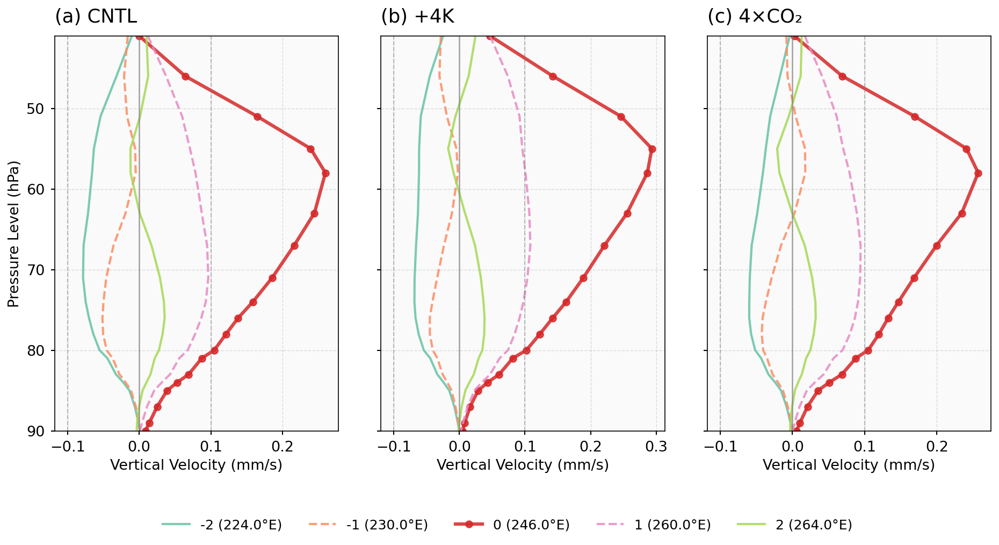

In [31]:

from scipy.ndimage import gaussian_filter1d

def plot_vertical_profiles_comparison(wa_composites, ua_composites, 
                                      experiments=['CNTL', 'P4K', '4CO2'],
                                      lag=0, lat_range=(-5, 5), lon_range=(100, 200),
                                      level_range=(46, 90), figsize=(15, 10),
                                      manual_lons=None):
    """
    绘制选定经度位置的垂直剖面对比图（专业美观版）
    """
    # 🔍 确定统一的经度位置
    first_exp = experiments[0]
    if first_exp not in wa_composites:
        print(f"❌ {first_exp} 数据不可用")
        return None, None
    
    wa_comp = wa_composites[first_exp]
    
    # 检查 level 维度
    if 'level' in wa_comp.dims:
        level_dim = 'level'
    elif 'lev' in wa_comp.dims:
        level_dim = 'lev'
    else:
        print("❌ 找不到 level 维度")
        return None, None
    
    # 取第一个实验数据用于计算中心经度
    wa_data = wa_comp.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
    wa_plot = wa_data * 100  # Pa/s -> mm/s
    
    level_vals = wa_data[level_dim].values
    lon_vals = wa_data.lon.values
    
    # 限制层范围
    level_mask = (level_vals >= level_range[0]) & (level_vals <= level_range[1])
    level_subset = level_vals[level_mask]
    wa_subset = wa_plot.values[level_mask, :]
    
    # 垂直平均找正负异常
    vertical_mean = np.nanmean(wa_subset, axis=0)
    center_lon_idx = np.nanargmax(vertical_mean)
    center_lon = lon_vals[center_lon_idx]
    
    # 左侧负异常
    left_mean = vertical_mean[:max(0, center_lon_idx-5)]
    left_lon = lon_vals[np.nanargmin(left_mean)] if len(left_mean)>0 and np.any(left_mean<0) else lon_vals[0]
    
    # 右侧负异常
    right_mean = vertical_mean[min(len(vertical_mean)-1, center_lon_idx+5):]
    right_lon = lon_vals[min(np.nanargmin(right_mean)+center_lon_idx+5, len(lon_vals)-1)] if len(right_mean)>0 and np.any(right_mean<0) else lon_vals[-1]
    
    # 手动指定经度
    if manual_lons is not None:
        n_lons = len(manual_lons)
        if n_lons < 1:
            print("❌ manual_lons 至少包含1个值")
            return None, None
        print(f"📍 使用手动经度: {manual_lons}")
        unified_lons = {f'position_{i}': lon for i, lon in enumerate(manual_lons)}
    else:
        # 自动计算
        transition_1 = 230
        transition_2 = 265
        unified_lons = {
            'negative_left': left_lon,
            'transition_1': transition_1,
            'positive_center': center_lon,
            'transition_2': transition_2,
            'negative_right': right_lon
        }
        print(f"✅ 自动经度位置: {unified_lons}")
    
    # 创建图形
    n_exp = len(experiments)
    fig, axes = plt.subplots(1, n_exp, figsize=figsize, dpi=150, sharey=True)
    if n_exp == 1:
        axes = [axes]
    
    exp_titles = {'CNTL': 'CNTL', 'P4K': '+4K', '4CO2': r'4×CO₂'}
    
    # 颜色与样式设置
    n_profiles = len(unified_lons)
    if n_profiles <= 5:
        import matplotlib.cm as cm
        colors = cm.Set2.colors[:n_profiles]
    else:
        cmap = cm.get_cmap('tab20')
        colors = [cmap(i/n_profiles) for i in range(n_profiles)]
    highlight_color = '#d62728'
    linestyles = ['-', '--'] * (n_profiles // 2 + 1)
    linestyles = linestyles[:n_profiles]
    
    for i, exp in enumerate(experiments):
        ax = axes[i]
        if exp not in wa_composites:
            continue
        
        wa_comp = wa_composites[exp]
        wa_data = wa_comp.sel(lag=lag, lat=slice(*lat_range), lon=slice(*lon_range)).mean(dim='lat')
        wa_plot = wa_data * 100
        level_vals = wa_data[level_dim].values
        lon_vals = wa_data.lon.values
        level_mask = (level_vals >= level_range[0]) & (level_vals <= level_range[1])
        level_subset = level_vals[level_mask]
        wa_subset = wa_plot.values[level_mask, :]
        
        # 生成 profile 标签
        if manual_lons is not None:
            if n_profiles == 1:
                profile_labels = ['0']
            elif n_profiles % 2 == 1:
                center_idx = n_profiles // 2
                profile_labels = [str(j - center_idx) for j in range(n_profiles)]
            else:
                profile_labels = [str(j - n_profiles // 2 + 0.5) for j in range(n_profiles)]
        else:
            profile_labels = ['Left-', 'Trans-', 'Center', 'Trans+', 'Right+'][:n_profiles]
        
        # 绘制曲线
        for j, (key, target_lon) in enumerate(unified_lons.items()):
            lon_idx = np.argmin(np.abs(lon_vals - target_lon))
            profile = wa_subset[:, lon_idx]
            profile_smooth = gaussian_filter1d(profile, sigma=1)
            
            is_center = (n_profiles % 2 == 1) and (j == n_profiles//2)
            color_use = highlight_color if is_center else colors[j]
            
            ax.plot(profile_smooth, level_subset,
                    color=color_use,
                    linestyle=linestyles[j],
                    linewidth=3.0 if is_center else 2.0,
                    label=f'{profile_labels[j]} ({lon_vals[lon_idx]:.1f}°E)',
                    marker='o' if is_center else None,
                    markersize=6 if is_center else 0,
                    alpha=0.85)
        
        # 零线与参考线
        ax.axvline(0, color='gray', linestyle='-', linewidth=1.2, alpha=0.7)
        ax.axvline(0.1, color='gray', linestyle='--', linewidth=1.0, alpha=0.5)
        ax.axvline(-0.1, color='gray', linestyle='--', linewidth=1.0, alpha=0.5)
        
        # 设置 y 轴、网格、标题
        ax.set_ylim(level_range[1], level_range[0])
        ax.set_xlabel('Vertical Velocity (mm/s)', fontsize=13)
        ax.grid(True, linestyle='--', linewidth=0.7, alpha=0.25, color='gray')
        ax.set_facecolor('#FAFAFA')
        ax.set_title(f'({chr(97+i)}) {exp_titles.get(exp, exp)}', fontsize=17, loc='left', pad=12)
        ax.tick_params(which='both', direction='out', width=1.0, pad=5, labelsize=13)
        if i == 0:
            ax.set_ylabel('Pressure Level (hPa)', fontsize=13)
        ax.set_axisbelow(True)
    
    # 统一 legend
    handles, labels = axes[0].get_legend_handles_labels()
    ncol = min(n_profiles, 5)
    fig.legend(handles, labels,
               loc='lower center',
               bbox_to_anchor=(0.5, -0.02),
               ncol=ncol,
               fontsize=12,
               frameon=False)
    
    plt.subplots_adjust(bottom=0.18, wspace=0.15)
    
    # 保存
    save_path = f'./figures/pr_regression_composite/vertical_profiles_fixed_lons_day{lag:+d}.png'
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"💾 Figure saved: {save_path}")
    
    return fig, unified_lons

fig, selected_lons = plot_vertical_profiles_comparison(
    wa_composites=wa_composites,
    ua_composites=ua_composites,
    experiments=['CNTL', 'P4K', '4CO2'],
    lag=lag_day,
    lat_range=(5, 15),
    lon_range=(200, 300),
    level_range=(41, 90),
    figsize=(15, 7),
    
    manual_lons=[ 225, 230, 246, 260,265]  
)
plt.show()